In [1]:
# pip install cartopy
# pip install cdo
# pip install mycolorpy

In [2]:
import numpy as np
import pandas as pd
import xarray as xr
from matplotlib import cm
import cartopy.crs as ccrs
import matplotlib.pyplot as plt 
import os
import scipy
import matplotlib.colors
from matplotlib.colors import BoundaryNorm
import cdo
CDO = cdo.Cdo
import netCDF4
import datetime
from mycolorpy import colorlist as mcp
import xskillscore as xs
import seaborn as sns
from matplotlib import rcParams
rcParams['font.family'] = 'Arial'
#rcParams['font.family'] = 'sans-serif'
#rcParams['font.sans-serif'] = ['Tahoma']



In [3]:
# climcal4.giub.unibe.ch:/scratch3/martinw/rnn/figure_data/
input_folder="/Users/mwegmann/Documents/small_spark/figure_data/"

## Figure 1

In [4]:
pseudo_proxy_location=pd.read_csv(input_folder+"EKF400_v1_assim_ISTI_less1831_smallest.txt", delimiter = " ")
lats=pseudo_proxy_location.Lat.values
lons=pseudo_proxy_location.Lon.values
pseudo_proxy_location.head()

,Station ID,Var,Lon,Lat,fyr,lyr
11,USC00508503,temp2,-135.333298,57.049999,1828,1990
69,USC00226177,temp2,-91.340797,31.588900,1799,2005
125,USW00013880,temp2,-80.040298,32.898602,1823,2005
184,USW00014735,temp2,-73.809196,42.743099,1795,2005
245,IN020040900,temp2,80.182999,13.000000,1796,2005


### Figure 1a

I select out of large local files the january 1901 field of the first member.

Once we chose the winter for the story telling in figure 5, we could use the same winter here in Figure 1. I think that would be a nice continuity.

In [5]:
#CDO.seltimestep(1,input="-selyear,1901 "+pathToMPIGE + 'tas_Amon_all_datapoints_anoms.nc',output=pathToMPIGE + 'mem01_january1901_anom.nc')
#CDO.seltimestep(1,input="-selyear,1901 "+'/Volumes/SPARK/20crv3/t2m/20CRv3_allyears_allmembers_t2m_anoms.nc',output=pathToERA + 'mem01_january1901_anom.nc')
#CDO.seltimestep(1,input="-selyear,1901 "+pathToCSMLME + 'TREFHT_Amon_all_datapoints_anoms.nc',output=pathToCSMLME + 'mem01_january1901_anom.nc')
#CDO.mergetime(input=input_folder+"mem01_january1901_anom_20cr_mem.nc "+input_folder+"mem01_january1901_anom_csmlme.nc "+input_folder+"mem01_january1901_anom_mpige.nc",output=input_folder+"mem01_january1901_anom_merged.nc")

In [6]:
ds1 = xr.open_dataset(input_folder+"mem01_january1901_anom_20cr_mem.nc")
ds1_var=ds1["2t"].drop('height')
ds1_var = ds1_var.squeeze('height')
ds2 = xr.open_dataset(input_folder+"mem01_january1901_anom_csmlme.nc")
ds2_var=ds2.TREFHT
ds3 = xr.open_dataset(input_folder+"mem01_january1901_anom_mpige.nc")
ds3_var=ds3.tas

''

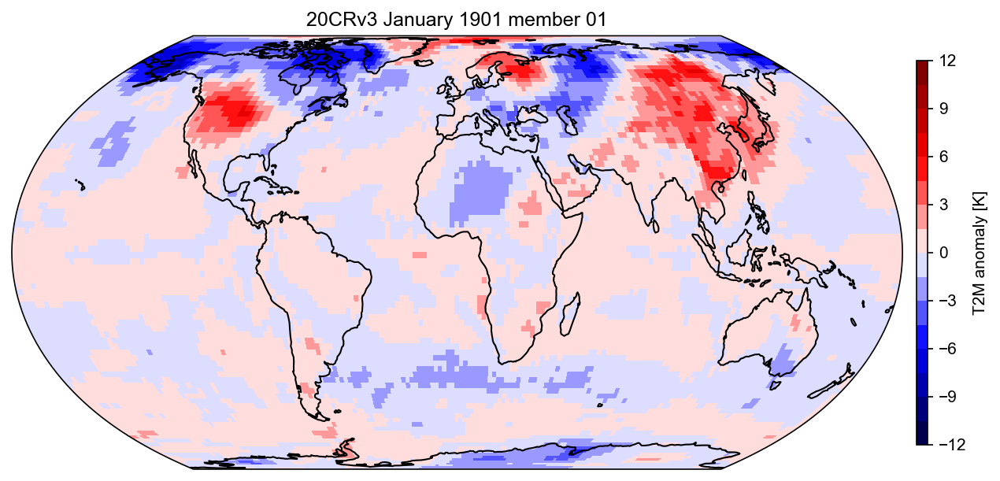

In [7]:
fig = plt.figure(figsize=(10, 5), dpi= 150)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds1_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=12, cmap=cm.seismic, cbar_kwargs={'orientation':'vertical',
'fraction':0.012, 'pad':0.015, 'aspect':35})
#ax.scatter(lons[0:25],lats[0:25],transform=ccrs.PlateCarree(),s=60,marker="D",facecolor='yellow',edgecolor="k",zorder=2)

#ax.scatter(lons[25:29],lats[25:29],transform=ccrs.PlateCarree(),s=50,marker='*',facecolor='yellow')



tplot.colorbar.set_label('T2M anomaly [K]', size=10) 
tplot.ylabel_style = {'size':16}
#plt.rcParams['font.family'] = 'serif'
#plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']

ax.set_global()
ax.coastlines()
ax.set_title('20CRv3 January 1901 member 01')
;

''

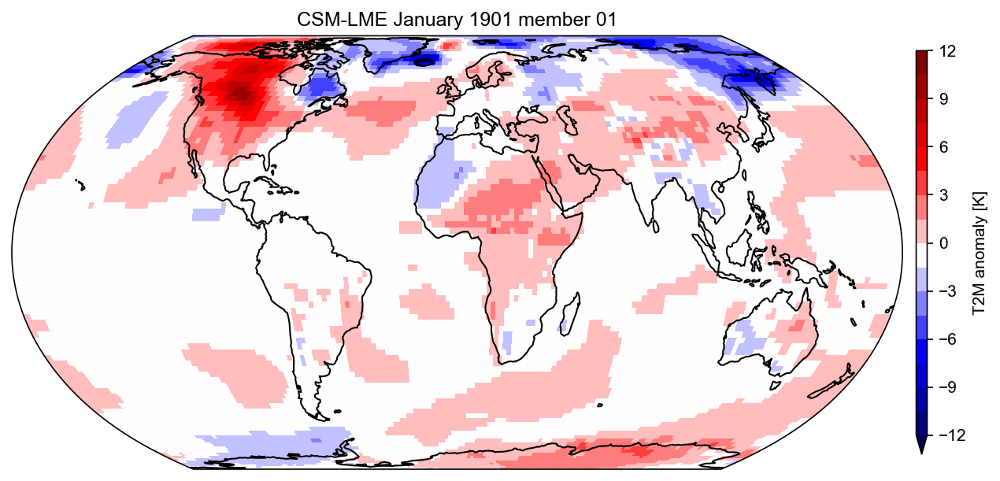

In [8]:
fig = plt.figure(figsize=(10, 5), dpi= 150)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds2_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=12,vmin=-12, cmap=cm.seismic, cbar_kwargs={'orientation':'vertical',
'fraction':0.012, 'pad':0.015, 'aspect':35})
#ax.scatter(lons[0:25],lats[0:25],transform=ccrs.PlateCarree(),s=60,marker="D",facecolor='yellow',edgecolor="k",zorder=2)

#ax.scatter(lons[25:29],lats[25:29],transform=ccrs.PlateCarree(),s=50,marker='*',facecolor='yellow')



tplot.colorbar.set_label('T2M anomaly [K]', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('CSM-LME January 1901 member 01')
;

''

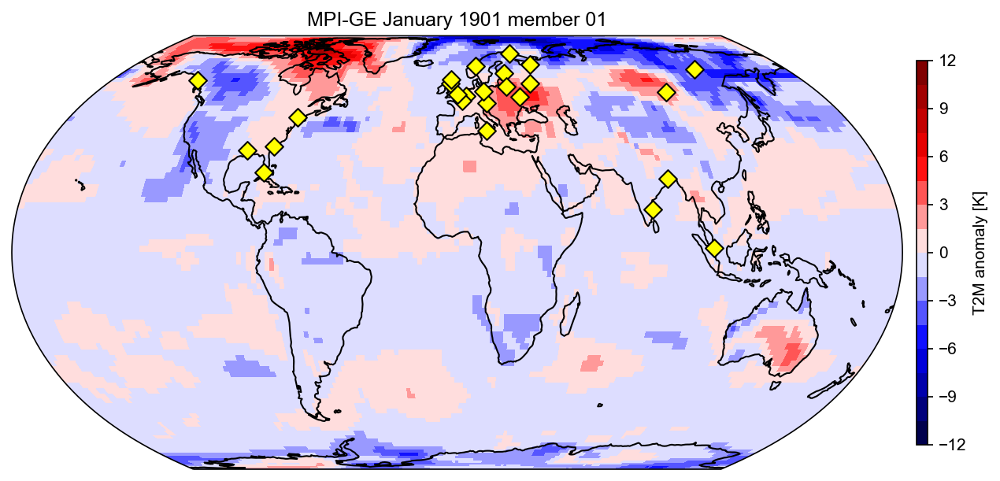

In [9]:
fig = plt.figure(figsize=(10, 5), dpi= 150)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds3_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=12, cmap=cm.seismic, cbar_kwargs={'orientation':'vertical',
'fraction':0.012, 'pad':0.015, 'aspect':35})
ax.scatter(lons[0:25],lats[0:25],transform=ccrs.PlateCarree(),s=60,marker="D",facecolor='yellow',edgecolor="k",zorder=2)

#ax.scatter(lons[25:29],lats[25:29],transform=ccrs.PlateCarree(),s=50,marker='*',facecolor='yellow')



tplot.colorbar.set_label('T2M anomaly [K]', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('MPI-GE January 1901 member 01')
;

### Figure 1b

In [10]:
arr = os.listdir(input_folder)
input_paths=[]
for file in os.listdir(input_folder):
    if file.startswith("EKF400v2_"):
        input_folder_file=os.path.join(input_folder, file)
        input_paths.append(input_folder_file)
len(input_paths)

30

In [11]:
emptyobject=[]

member_index_length = len(input_paths)

for i in range(member_index_length):
    df2 = pd.read_csv(input_paths[i], delimiter = ";",header=None)
    df = pd.DataFrame(df2.values, index=pd.period_range('1602-01-16', '2003-12-16',freq="m"))
    # frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]

    emptyobject.append(df)
    #plt.figure(figsize=(10, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



df3 = pd.concat(emptyobject,axis=1)



In [12]:
df3.shape # 4824 months, 25 stations times 30 member

(4824, 750)

In [13]:
select_one_station=np.arange(0,750,25)
select_one_station

array([  0,  25,  50,  75, 100, 125, 150, 175, 200, 225, 250, 275, 300,
       325, 350, 375, 400, 425, 450, 475, 500, 525, 550, 575, 600, 625,
       650, 675, 700, 725])

In [14]:
a=np.random.randint(1000, size=(200))
a=np.array(a)
a=lats
color1=mcp.gen_color_normalized(cmap="viridis",data_arr=a)
# plt.scatter(a,a,c=color1)

In [15]:
df3_select_one_station=pd.DataFrame(df3.values[3588:3588+12,select_one_station])
df3_select_all_station=pd.DataFrame(df3.values[3588:3588+12,:])
df3_one_station=pd.DataFrame(df3.values[:,select_one_station])
df3_all_station_one_member=pd.DataFrame(df3.values[:,0:25])
df3_all_station_one_member_one_year=pd.DataFrame(df3.values[3588:3588+12,0:25])
df3_all_station_one_member_100_year=pd.DataFrame(df3.values[3624:4824,0:25])

In [16]:
df3_select_one_station.shape

(12, 30)

Text(0.5, 1.0, 'Member Spread 1901 Station #1')

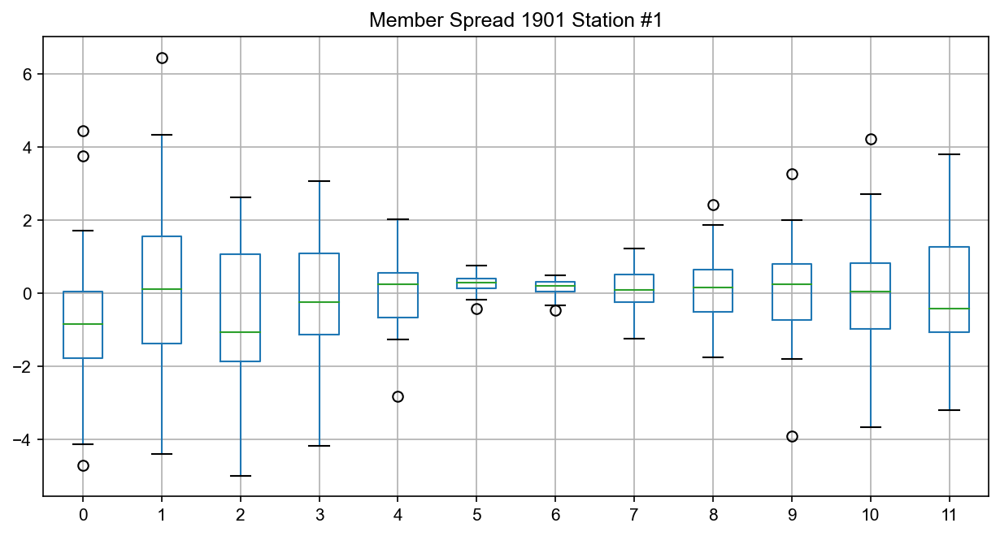

In [17]:
plt.figure(figsize=(10, 5), dpi= 150)
df3_select_one_station.T.boxplot()
plt.title("Member Spread 1901 Station #1")

<AxesSubplot:title={'center':'EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980'}, xlabel='Time', ylabel='[K]'>

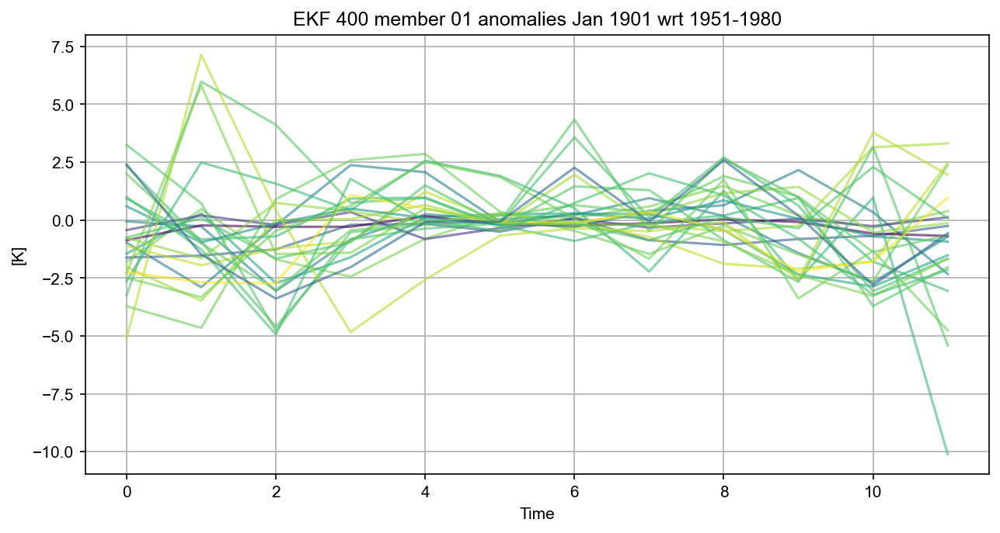

In [18]:
# 25 pseudo stations, one member. I prefer this figure as figure 1 b
plt.figure(figsize=(10, 5), dpi= 150)
df3_all_station_one_member_one_year.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980',grid=1,style='-',color=color1, ax = plt.gca(), alpha=0.6,legend=False)

<AxesSubplot:title={'center':'EKF 400 member 01-30 anomalies Jan 1901 wrt 1951-1980'}, xlabel='Time', ylabel='[K]'>

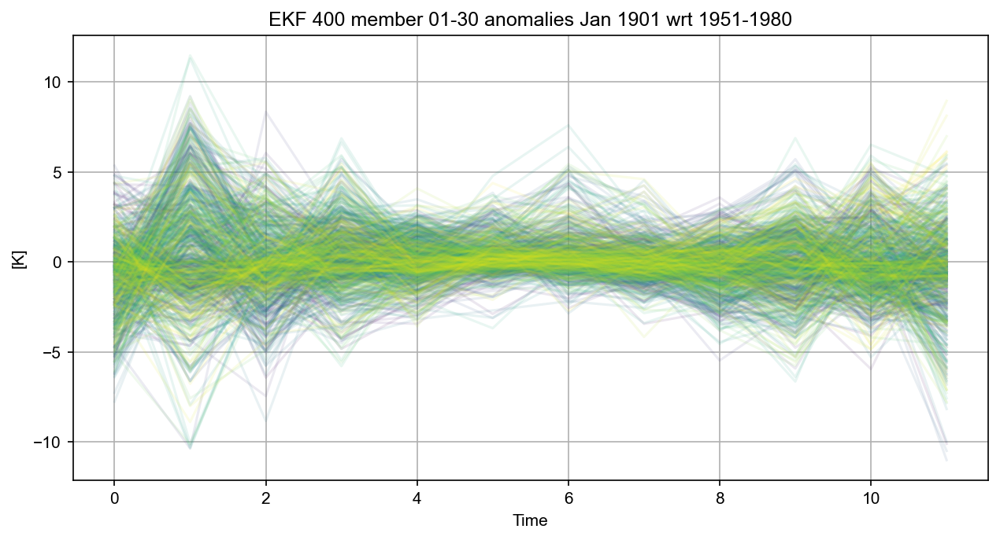

In [19]:
# 25 pseudo stations, all member
plt.figure(figsize=(10, 5), dpi= 150)
df3_select_all_station.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01-30 anomalies Jan 1901 wrt 1951-1980',grid=1,style='-',colormap=cm.viridis, ax = plt.gca(), alpha=0.1,legend=False)






<AxesSubplot:title={'center':'EKF 400 member 01 anomalies anomalies wrt 1951-1980'}, xlabel='Time', ylabel='[K]'>

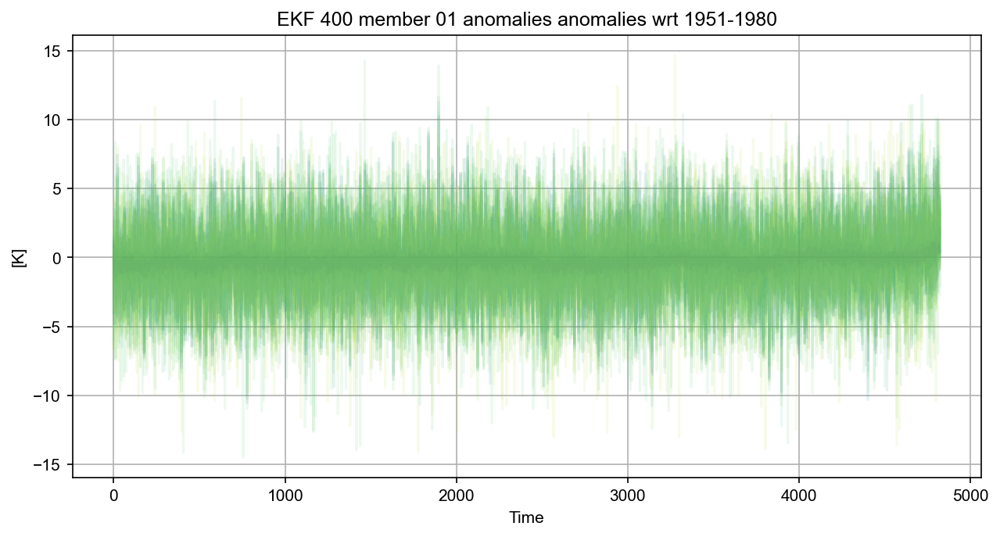

In [20]:
# 25 pseudo stations, one member
plt.figure(figsize=(10, 5), dpi= 150)
df3_all_station_one_member.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies anomalies wrt 1951-1980',grid=1,color=color1,style='-', ax = plt.gca(), alpha=0.1,legend=False)





## Figure 2

In [21]:
current_cmap = cm.get_cmap("seismic")
current_cmap.set_bad(color='gray')

/Users/mwegmann/miniconda2/envs/temprec/lib/python3.7/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic"))
  


In [22]:

ds2 = xr.open_dataset(input_folder + 'best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_monthly_masked.nc')
ds2_var=ds2.t2m
ds2a = xr.open_dataset(input_folder + 'best_model_ekf400_anoms_mpige_lowres_25_20000_RNN1lstm_memcorr_matrix_rnn_ekf400_monthly_masked.nc')
ds2a_var=ds2a.t2m
ds3 = xr.open_dataset(input_folder + 'best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_YM_masked.nc')
ds3_var=ds3.t2m

ds3a = xr.open_dataset(input_folder + 'best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_lmr_YM_masked.nc')
ds3a_var=ds3a.t2m

ds6 = xr.open_dataset(input_folder + 'best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_JJA_masked.nc')
ds6_var=ds6.t2m
ds7 = xr.open_dataset(input_folder + 'best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_DJF_masked.nc')
ds7_var=ds7.t2m


ds_merged=xr.concat([ds2_var, ds3_var,ds6_var,ds7_var],dim="height")

ds_merged6=xr.concat([ds2_var, ds3_var,ds2a_var,ds3a_var,ds6_var,ds7_var],dim="height")


In [23]:
ds_merged[0,0,:,:]

<xarray.DataArray 't2m' (lat: 96, lon: 192)>
array([[0.90407795, 0.90394485, 0.90383506, ..., 0.9040211 , 0.9038251 ,
        0.9035862 ],
       [0.96836036, 0.96928936, 0.9698102 , ..., 0.96577334, 0.96677065,
        0.9675937 ],
       [0.9913326 , 0.9932238 , 0.9948525 , ..., 0.9847067 , 0.9871192 ,
        0.9892352 ],
       ...,
       [0.347329  , 0.34046364, 0.3352428 , ..., 0.36068445, 0.35609224,
        0.35466057],
       [0.385904  , 0.3747345 , 0.3714663 , ..., 0.38126543, 0.36897534,
        0.37591946],
       [0.37302223, 0.37784418, 0.37564802, ..., 0.38059843, 0.37636244,
        0.37870768]], dtype=float32)
Coordinates:
  * lon      (lon) float32 -180.0 -178.1 -176.2 -174.4 ... 174.4 176.2 178.1
  * lat      (lat) float32 89.06 87.19 85.31 83.44 ... -85.31 -87.19 -89.06
    time     datetime64[ns] 1900-01-01
Attributes:
    units:    K

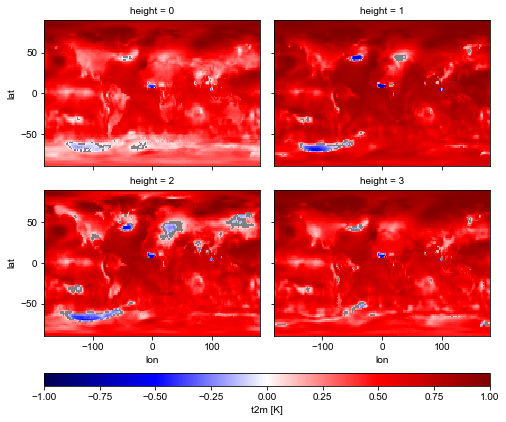

In [24]:
fg = ds_merged.plot(
    col="height",
    col_wrap=2, vmax=1, cmap=cm.seismic, cbar_kwargs={'orientation':'horizontal',
'fraction':0.042, 'pad':0.1, 'aspect':35} # each row has a maximum of 4 columns
)

/Users/mwegmann/miniconda2/envs/temprec/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:310: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


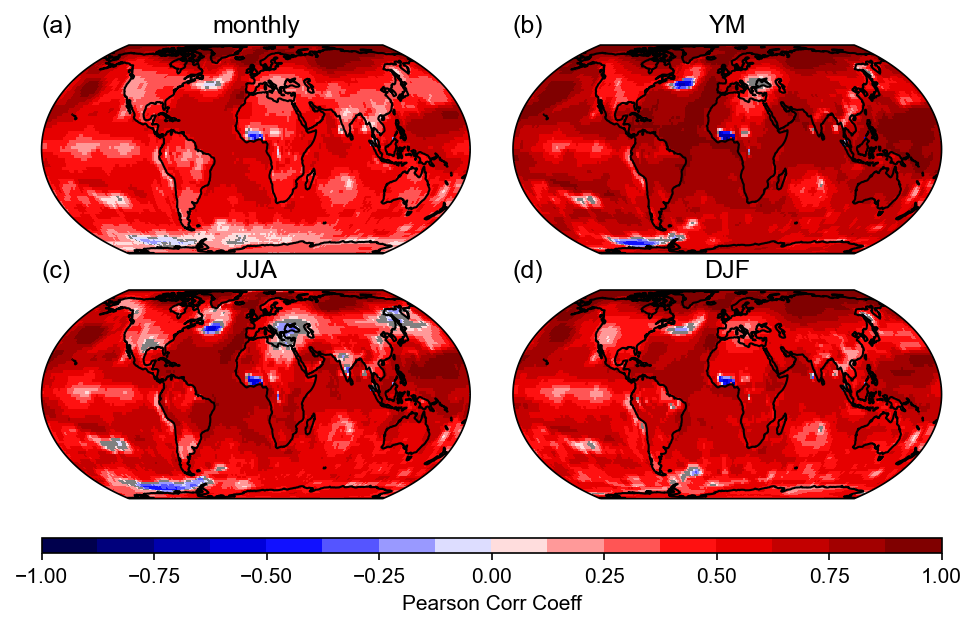

In [25]:
seasons=list(["monthly","YM","JJA","DJF"])
INDEX=list(["(a)","(b)","(c)","(d)"])
fig, axs = plt.subplots(2, 2, figsize=(10, 5), dpi= 150,subplot_kw={'projection': ccrs.EqualEarth(central_longitude=0, globe=None)})
# axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
axs=axs.flatten()

#Loop over all of the models
for i in range(4):
    tplot=ds_merged[i,:,:,:].isel(time=0).plot.pcolormesh(ax=axs[i],levels = 17, vmax=1, transform=ccrs.PlateCarree(), cmap=cm.seismic,add_colorbar=False)
    axs[i].set_title(INDEX[i],loc='left')
    axs[i].coastlines()
    axs[i].set_title(seasons[i])

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.25, top=0.9, left=0.2, right=0.8,
                    wspace=0.1, hspace=0.01)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(tplot, cax=cbar_ax,orientation='horizontal')
cbar.set_label('Pearson Corr Coeff', size=10) 




# Make it nice
#plt.tight_layout()

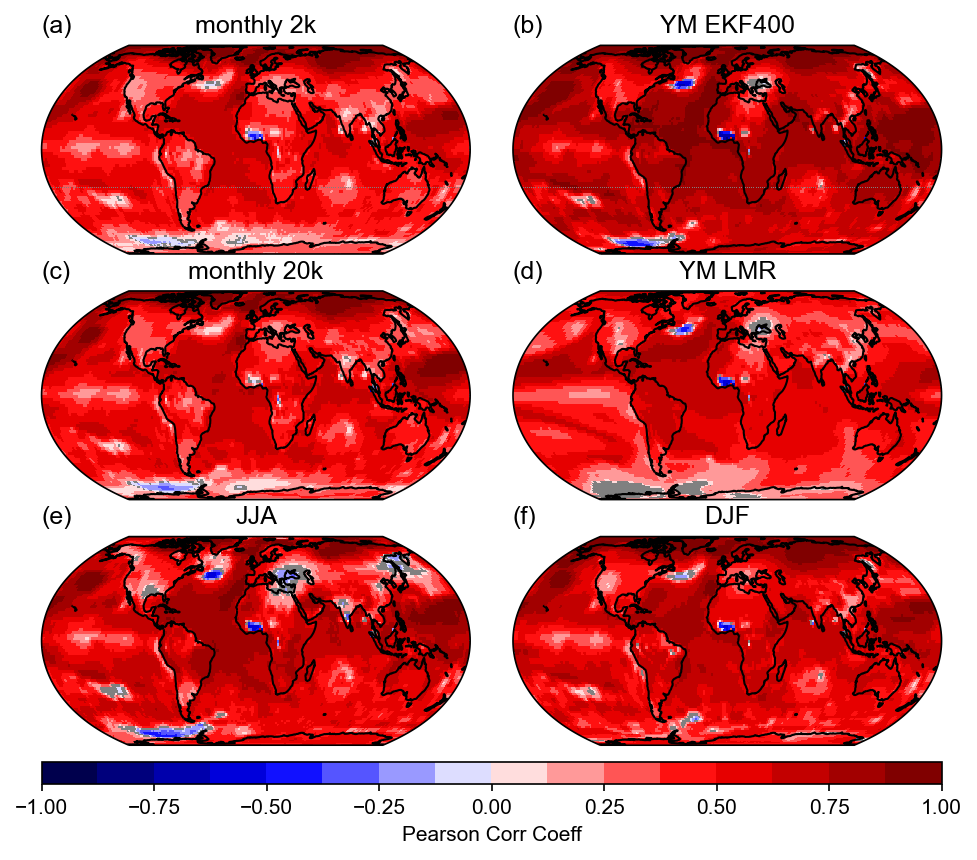

In [26]:
seasons=list(["monthly 2k","YM EKF400","monthly 20k","YM LMR","JJA","DJF"])
INDEX=list(["(a)","(b)","(c)","(d)","(e)","(f)"])
fig, axs = plt.subplots(3, 2, figsize=(10, 7.2), dpi= 150,subplot_kw={'projection': ccrs.EqualEarth(central_longitude=0, globe=None)})
# axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
axs=axs.flatten()

#Loop over all of the models
for i in range(6):
    tplot=ds_merged6[i,:,:,:].isel(time=0).plot.pcolormesh(ax=axs[i],levels = 17, vmax=1, transform=ccrs.PlateCarree(), cmap=cm.seismic,add_colorbar=False)
    axs[i].set_title(INDEX[i],loc='left')
    axs[i].coastlines()
    axs[i].set_title(seasons[i])

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.22, top=0.9, left=0.2, right=0.8,
                    wspace=0.1, hspace=0.01)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(tplot, cax=cbar_ax,orientation='horizontal')
cbar.set_label('Pearson Corr Coeff', size=10) 




# Make it nice
#plt.tight_layout()

## Alternative figure 2 with ensemble mean from 30 members

In [27]:

ds2_ens = xr.open_dataset(input_folder + 'best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_monthly_masked.nc')
ds2_ens_var=ds2_ens.t2m
ds3_ens = xr.open_dataset(input_folder + 'best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_YM_masked.nc')
ds3_ens_var=ds3_ens.t2m

ds3a_ens = xr.open_dataset(input_folder + 'best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_lmr_YM_masked.nc')
ds3a_ens_var=ds3a_ens.t2m

ds6_ens = xr.open_dataset(input_folder + 'best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_JJA_masked.nc')
ds6_ens_var=ds6_ens.t2m
ds7_ens = xr.open_dataset(input_folder + 'best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_DJF_masked.nc')
ds7_ens_var=ds7_ens.t2m

ds_merged_ens=xr.concat([ds2_ens_var, ds3_ens_var,ds6_ens_var,ds7_ens_var],dim="height")





/Users/mwegmann/miniconda2/envs/temprec/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:310: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


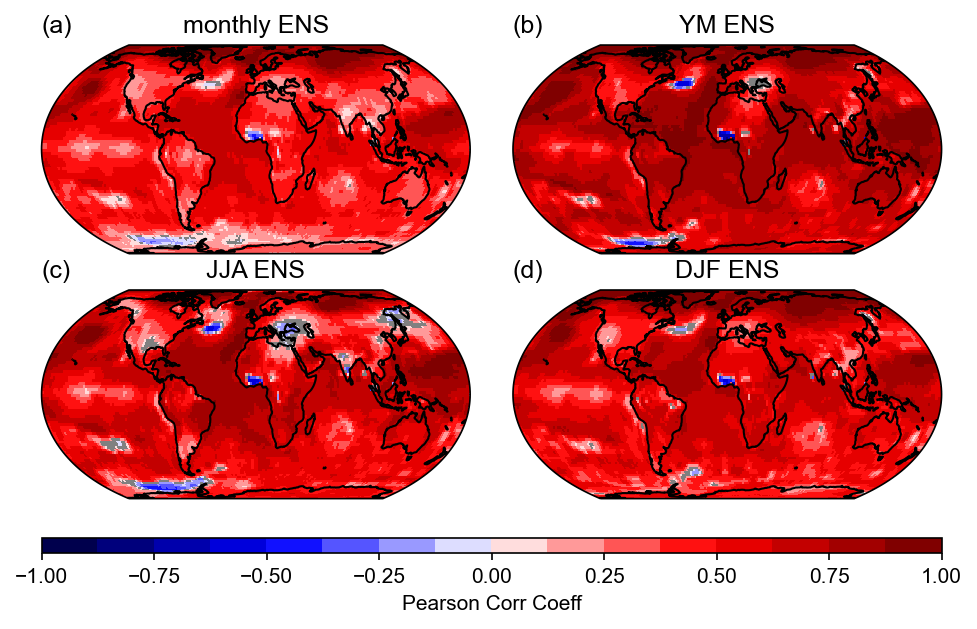

In [28]:
seasons=list(["monthly ENS","YM ENS","JJA ENS","DJF ENS"])
INDEX=list(["(a)","(b)","(c)","(d)"])
fig, axs = plt.subplots(2, 2, figsize=(10, 5), dpi= 150,subplot_kw={'projection': ccrs.EqualEarth(central_longitude=0, globe=None)})
# axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
axs=axs.flatten()

#Loop over all of the models
for i in range(4):
    tplot=ds_merged_ens[i,:,:,:].isel(time=0).plot.pcolormesh(ax=axs[i],levels = 17, vmax=1, transform=ccrs.PlateCarree(), cmap=cm.seismic,add_colorbar=False)
    axs[i].set_title(INDEX[i],loc='left')
    axs[i].coastlines()
    axs[i].set_title(seasons[i])

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.25, top=0.9, left=0.2, right=0.8,
                    wspace=0.1, hspace=0.01)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(tplot, cax=cbar_ax,orientation='horizontal')
cbar.set_label('Pearson Corr Coeff', size=10) 




# Make it nice
#plt.tight_layout()

''

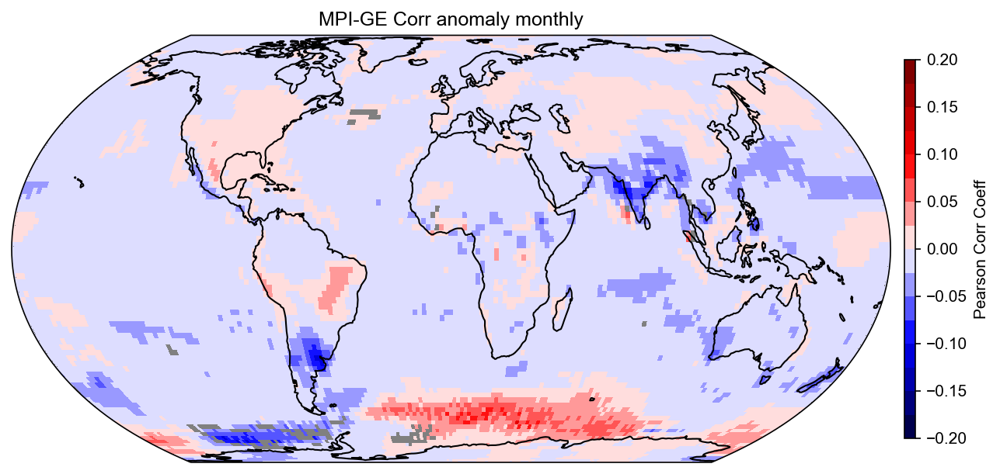

In [29]:
anomalies_monthly_timcor=ds2_ens_var-ds2_var


fig = plt.figure(figsize=(10, 5), dpi= 150)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=anomalies_monthly_timcor.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=0.2, cmap=cm.seismic, cbar_kwargs={'orientation':'vertical',
'fraction':0.012, 'pad':0.015, 'aspect':35})
#ax.scatter(lons[0:25],lats[0:25],transform=ccrs.PlateCarree(),s=60,marker="D",facecolor='yellow',edgecolor="k",zorder=2)

#ax.scatter(lons[25:29],lats[25:29],transform=ccrs.PlateCarree(),s=50,marker='*',facecolor='yellow')



tplot.colorbar.set_label('Pearson Corr Coeff', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('MPI-GE Corr anomaly monthly')
;

''

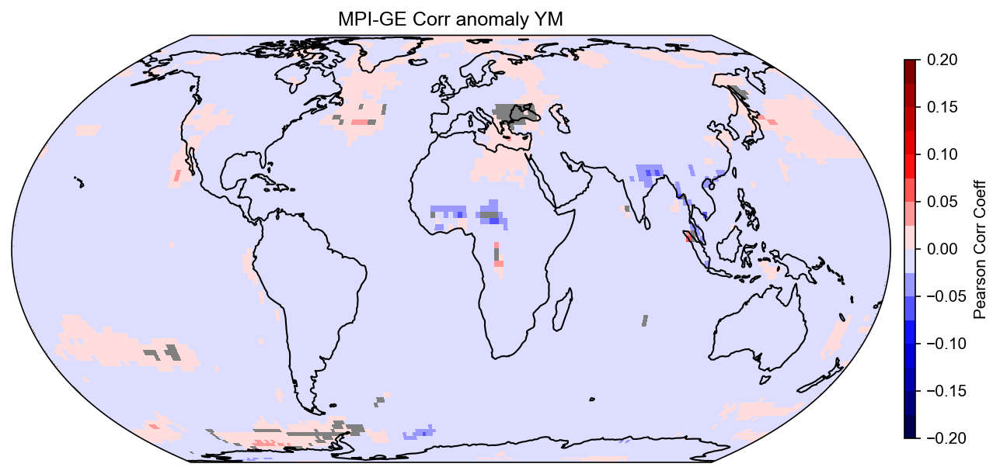

In [30]:
anomalies_yearly_timcor=ds3_ens_var-ds3_var


fig = plt.figure(figsize=(10, 5), dpi= 150)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=anomalies_yearly_timcor.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=0.2, cmap=cm.seismic, cbar_kwargs={'orientation':'vertical',
'fraction':0.012, 'pad':0.015, 'aspect':35})
#ax.scatter(lons[0:25],lats[0:25],transform=ccrs.PlateCarree(),s=60,marker="D",facecolor='yellow',edgecolor="k",zorder=2)

#ax.scatter(lons[25:29],lats[25:29],transform=ccrs.PlateCarree(),s=50,marker='*',facecolor='yellow')



tplot.colorbar.set_label('Pearson Corr Coeff', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('MPI-GE Corr anomaly YM')
;

In [31]:
pathToPostprocess = '/Volumes/DATAHUB/RNN_savestates/plots/' 
#ds1 = xr.open_dataset(pathToERA + 'air.2m.mon.mean_18512015_anoms_rm_test2.nc')
#ds1_var=ds1.air
ds2m = xr.open_dataset(pathToPostprocess + 'best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_DJF_masked.nc')
ds2m_var_DJF=ds2m.t2m

ds2m = xr.open_dataset(pathToPostprocess + 'best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_JJA_masked.nc')
ds2m_var_JJA=ds2m.t2m

ds2m = xr.open_dataset(pathToPostprocess + 'best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_YM_masked.nc')
ds2m_var_YM=ds2m.t2m




ds2m = xr.open_dataset(pathToPostprocess + 'best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_monthly_masked.nc')
ds2m_var_mmonthly=ds2m.t2m

ds_merged_ens=xr.concat([ds2m_var_mmonthly, ds2m_var_YM,ds2m_var_JJA,ds2m_var_DJF],dim="height")



#air.2m.mon.mean_monanom.nc

/Users/mwegmann/miniconda2/envs/temprec/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:310: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


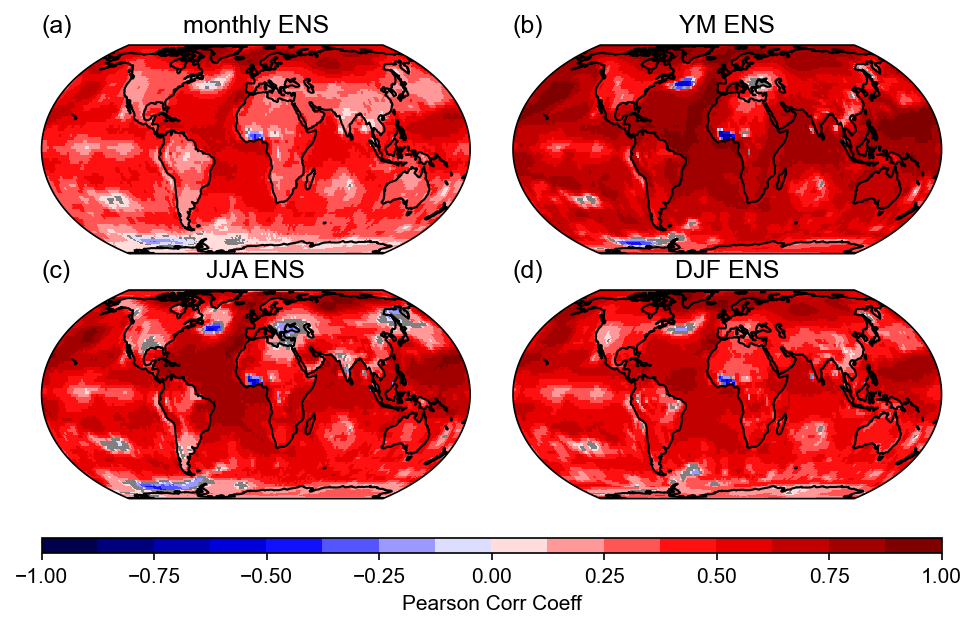

In [32]:
seasons=list(["monthly ENS","YM ENS","JJA ENS","DJF ENS"])
INDEX=list(["(a)","(b)","(c)","(d)"])
fig, axs = plt.subplots(2, 2, figsize=(10, 5), dpi= 150,subplot_kw={'projection': ccrs.EqualEarth(central_longitude=0, globe=None)})
# axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
axs=axs.flatten()

#Loop over all of the models
for i in range(4):
    tplot=ds_merged_ens[i,:,:,:].isel(time=0).plot.pcolormesh(ax=axs[i],levels = 17, vmax=1, transform=ccrs.PlateCarree(), cmap=cm.seismic,add_colorbar=False)
    axs[i].set_title(INDEX[i],loc='left')
    axs[i].coastlines()
    axs[i].set_title(seasons[i])

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.25, top=0.9, left=0.2, right=0.8,
                    wspace=0.1, hspace=0.01)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(tplot, cax=cbar_ax,orientation='horizontal')
cbar.set_label('Pearson Corr Coeff', size=10) 




# Make it nice
#plt.tight_layout()

''

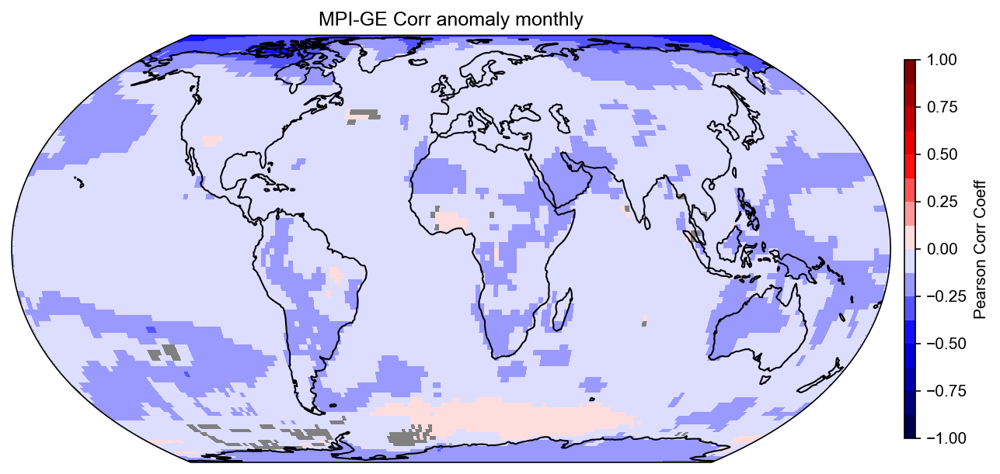

In [33]:
anomalies_monthly_timcor=ds2m_var_mmonthly-ds2_var


fig = plt.figure(figsize=(10, 5), dpi= 150)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=anomalies_monthly_timcor.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=1, cmap=cm.seismic, cbar_kwargs={'orientation':'vertical',
'fraction':0.012, 'pad':0.015, 'aspect':35})
#ax.scatter(lons[0:25],lats[0:25],transform=ccrs.PlateCarree(),s=60,marker="D",facecolor='yellow',edgecolor="k",zorder=2)

#ax.scatter(lons[25:29],lats[25:29],transform=ccrs.PlateCarree(),s=50,marker='*',facecolor='yellow')



tplot.colorbar.set_label('Pearson Corr Coeff', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('MPI-GE Corr anomaly monthly')
;

''

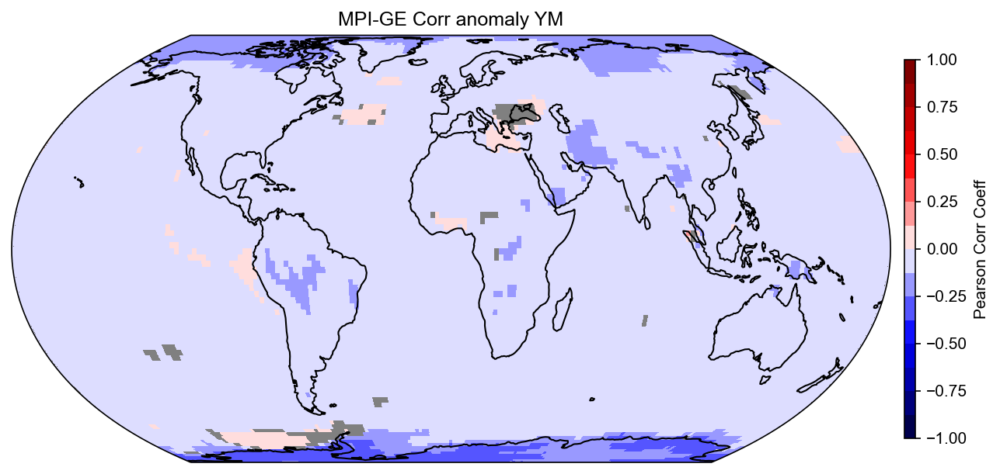

In [34]:
anomalies_yearly_timcor=ds2m_var_YM-ds3_var


fig = plt.figure(figsize=(10, 5), dpi= 150)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=anomalies_yearly_timcor.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=1, cmap=cm.seismic, cbar_kwargs={'orientation':'vertical',
'fraction':0.012, 'pad':0.015, 'aspect':35})
#ax.scatter(lons[0:25],lats[0:25],transform=ccrs.PlateCarree(),s=60,marker="D",facecolor='yellow',edgecolor="k",zorder=2)

#ax.scatter(lons[25:29],lats[25:29],transform=ccrs.PlateCarree(),s=50,marker='*',facecolor='yellow')



tplot.colorbar.set_label('Pearson Corr Coeff', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('MPI-GE Corr anomaly YM')
;

In [35]:
ds_merged8=xr.concat([ds2_var, ds3_var,ds2a_var,ds3a_var,anomalies_monthly_timcor,anomalies_yearly_timcor,ds6_var,ds7_var],dim="height")

ds_merged8_new=xr.concat([ds6_var,ds7_var,ds2_var, ds3_var,ds2m_var_mmonthly, ds2m_var_YM,ds2a_var,ds3a_var],dim="height")


anomalies_LMR=ds3a_var-ds3_var
anomalies_20k=ds2a_var-ds2_var

ds_merged_anoms=xr.concat([anomalies_20k,anomalies_LMR,anomalies_monthly_timcor,anomalies_yearly_timcor],dim="height")




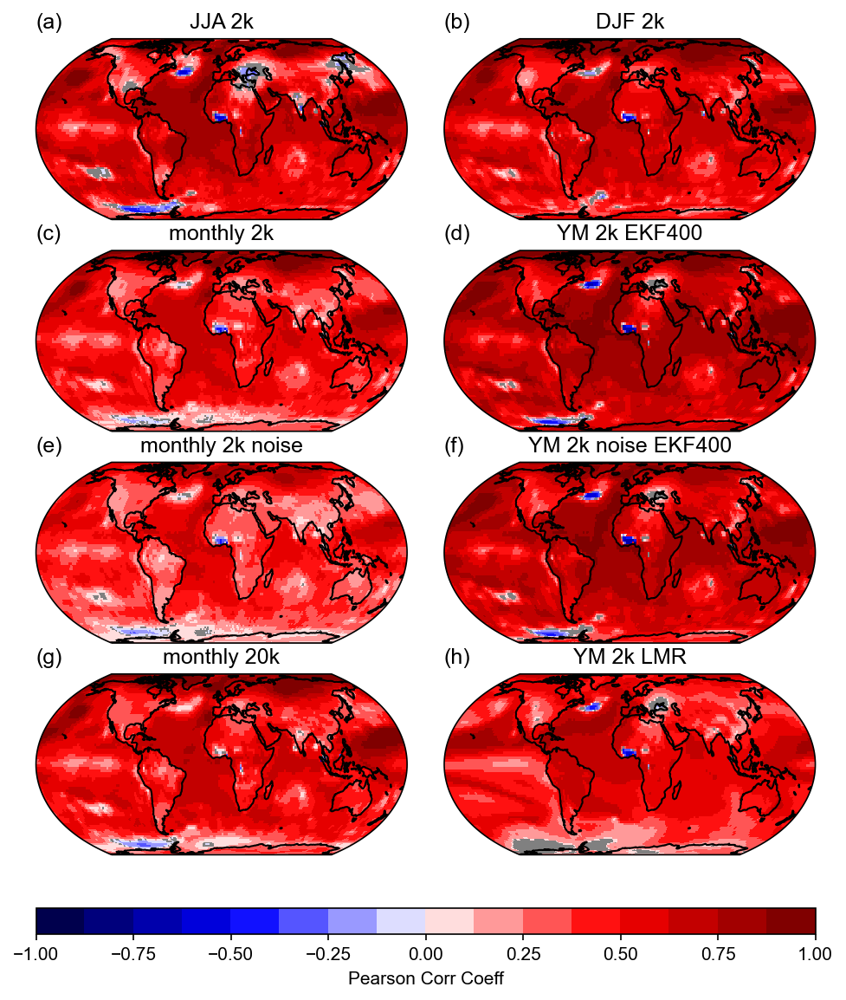

In [36]:
seasons=list(["JJA 2k","DJF 2k","monthly 2k","YM 2k EKF400","monthly 2k noise","YM 2k noise EKF400","monthly 20k","YM 2k LMR"])
INDEX=list(["(a)","(b)","(c)","(d)","(e)","(f)","(g)","(h)"])
fig, axs = plt.subplots(4, 2, figsize=(10, 10), dpi= 150,subplot_kw={'projection': ccrs.EqualEarth(central_longitude=0, globe=None)})
# axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
axs=axs.flatten()

#Loop over all of the models
for i in range(8):
    tplot=ds_merged8_new[i,:,:,:].isel(time=0).plot.pcolormesh(ax=axs[i],levels = 17, vmax=1, transform=ccrs.PlateCarree(), cmap=cm.seismic,add_colorbar=False)
    axs[i].set_title(INDEX[i],loc='left')
    axs[i].coastlines()
    axs[i].set_title(seasons[i])

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.25, top=0.9, left=0.2, right=0.8,
                    wspace=0.1, hspace=0.01)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(tplot, cax=cbar_ax,orientation='horizontal')
cbar.set_label('Pearson Corr Coeff', size=10) 





# Make it nice
#plt.tight_layout()

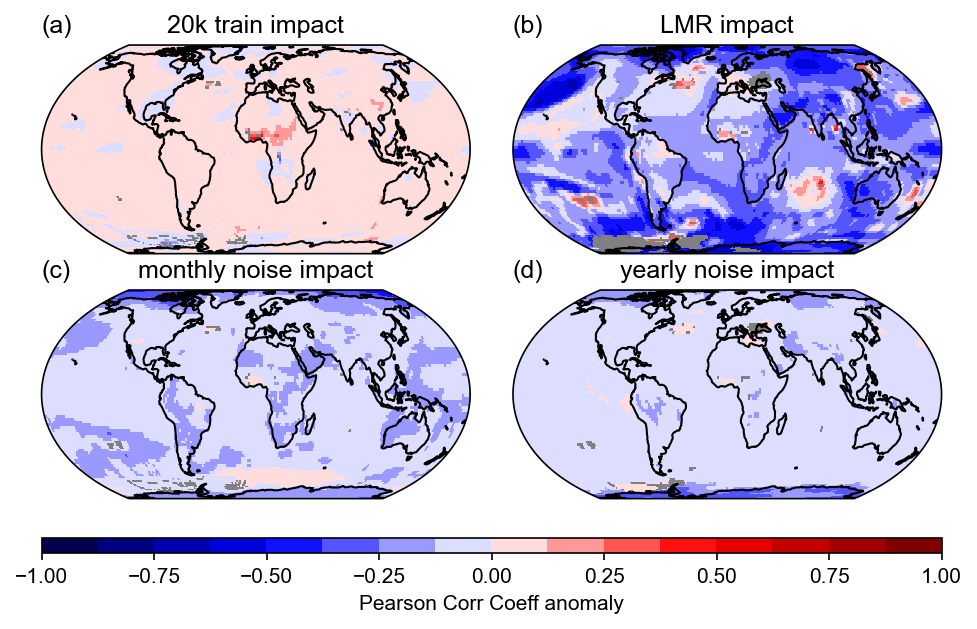

In [37]:
seasons=list(["20k train impact","LMR impact","monthly noise impact","yearly noise impact"])
INDEX=list(["(a)","(b)","(c)","(d)"])
fig, axs = plt.subplots(2, 2, figsize=(10, 5), dpi= 150,subplot_kw={'projection': ccrs.EqualEarth(central_longitude=0, globe=None)})
# axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
axs=axs.flatten()

#Loop over all of the models
for i in range(4):
    tplot=ds_merged_anoms[i,:,:,:].isel(time=0).plot.pcolormesh(ax=axs[i],levels = 17, vmax=1, transform=ccrs.PlateCarree(), cmap=cm.seismic,add_colorbar=False)
    axs[i].set_title(INDEX[i],loc='left')
    axs[i].coastlines()
    axs[i].set_title(seasons[i])

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.25, top=0.9, left=0.2, right=0.8,
                    wspace=0.1, hspace=0.01)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(tplot, cax=cbar_ax,orientation='horizontal')
cbar.set_label('Pearson Corr Coeff anomaly', size=10) 





# Make it nice
#plt.tight_layout()

## Figure 3

In [38]:
ekf_RNN_20cr_fldcor_JJA = xr.open_dataset(input_folder +"best_model_ekf400_anoms_20cr_lowres_25_1979_RNN1lstm_mem_JJA_all_fldcor.nc")
ekf_RNN_20cr_fldcor_JJA=ekf_RNN_20cr_fldcor_JJA.air_temperature.values[:,:,0,0]

ekf_RNN_mpige_fldcor_JJA = xr.open_dataset(input_folder +"best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_mem_JJA_all_fldcor.nc")
ekf_RNN_mpige_fldcor_JJA=ekf_RNN_mpige_fldcor_JJA.air_temperature.values[:,:,0,0]


ekf_RNN_csmlme_fldcor_JJA= xr.open_dataset(input_folder +"best_model_ekf400_anoms_csmlme_lowres_25_1979_RNN1lstm_mem_JJA_all_fldcor.nc")
ekf_RNN_csmlme_fldcor_JJA=ekf_RNN_csmlme_fldcor_JJA.air_temperature.values[:,:,0,0]


dfJJA = pd.DataFrame({"20cr": ekf_RNN_20cr_fldcor_JJA.mean(axis=1),"mpige": ekf_RNN_mpige_fldcor_JJA.mean(axis=1),"csmlme": ekf_RNN_csmlme_fldcor_JJA.mean(axis=1)}, index=pd.period_range('1602-01-16', '2003-12-16',freq="y"))

#air.2m.mon.mean_monanom.nc

In [39]:
ekf_RNN_20cr_fldcor_DJF = xr.open_dataset(input_folder +"best_model_ekf400_anoms_20cr_lowres_25_1979_RNN1lstm_mem_DJF_all_fldcor.nc")
ekf_RNN_20cr_fldcor_DJF=ekf_RNN_20cr_fldcor_DJF.air_temperature.values[:,:,0,0]

ekf_RNN_mpige_fldcor_DJF = xr.open_dataset(input_folder +"best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_mem_DJF_all_fldcor.nc")
ekf_RNN_mpige_fldcor_DJF=ekf_RNN_mpige_fldcor_DJF.air_temperature.values[:,:,0,0]


ekf_RNN_csmlme_fldcor_DJF= xr.open_dataset(input_folder +"best_model_ekf400_anoms_csmlme_lowres_25_1979_RNN1lstm_mem_DJF_all_fldcor.nc")
ekf_RNN_csmlme_fldcor_DJF=ekf_RNN_csmlme_fldcor_DJF.air_temperature.values[:,:,0,0]


dfDJF = pd.DataFrame({"20cr": ekf_RNN_20cr_fldcor_DJF.mean(axis=1),"mpige": ekf_RNN_mpige_fldcor_DJF.mean(axis=1),"csmlme": ekf_RNN_csmlme_fldcor_DJF.mean(axis=1)}, index=pd.period_range('1603-01-16', '2003-12-16',freq="y"))

#air.2m.mon.mean_monanom.nc

In [40]:
# rolling mean computation
ekf_RNN_20cr_fldcor_JJA_rm10=np.cumsum(ekf_RNN_20cr_fldcor_JJA, axis = 0)
ekf_RNN_20cr_fldcor_JJA_rm10=ekf_RNN_20cr_fldcor_JJA_rm10/10
ekf_RNN_20cr_fldcor_JJA_rm10[10:] -= ekf_RNN_20cr_fldcor_JJA_rm10[:-10]
ekf_RNN_20cr_fldcor_JJA_rm10=ekf_RNN_20cr_fldcor_JJA_rm10[9:]

ekf_RNN_mpige_fldcor_JJA_rm10=np.cumsum(ekf_RNN_mpige_fldcor_JJA, axis = 0)
ekf_RNN_mpige_fldcor_JJA_rm10=ekf_RNN_mpige_fldcor_JJA_rm10/10
ekf_RNN_mpige_fldcor_JJA_rm10[10:] -= ekf_RNN_mpige_fldcor_JJA_rm10[:-10]
ekf_RNN_mpige_fldcor_JJA_rm10=ekf_RNN_mpige_fldcor_JJA_rm10[9:]

ekf_RNN_csmlme_fldcor_JJA_rm10=np.cumsum(ekf_RNN_csmlme_fldcor_JJA, axis = 0)
ekf_RNN_csmlme_fldcor_JJA_rm10=ekf_RNN_csmlme_fldcor_JJA_rm10/10
ekf_RNN_csmlme_fldcor_JJA_rm10[10:] -= ekf_RNN_csmlme_fldcor_JJA_rm10[:-10]
ekf_RNN_csmlme_fldcor_JJA_rm10=ekf_RNN_csmlme_fldcor_JJA_rm10[9:]


dfJJA_rm10 = pd.DataFrame({"20cr": ekf_RNN_20cr_fldcor_JJA_rm10.mean(axis=1),"mpige": ekf_RNN_mpige_fldcor_JJA_rm10.mean(axis=1),"csmlme": ekf_RNN_csmlme_fldcor_JJA_rm10.mean(axis=1)}, index=pd.period_range('1607-01-16', '1999-12-16',freq="y"))



In [41]:
# rolling mean computation
ekf_RNN_20cr_fldcor_DJF_rm10=np.cumsum(ekf_RNN_20cr_fldcor_DJF, axis = 0)
ekf_RNN_20cr_fldcor_DJF_rm10=ekf_RNN_20cr_fldcor_DJF_rm10/10
ekf_RNN_20cr_fldcor_DJF_rm10[10:] -= ekf_RNN_20cr_fldcor_DJF_rm10[:-10]
ekf_RNN_20cr_fldcor_DJF_rm10=ekf_RNN_20cr_fldcor_DJF_rm10[9:]

ekf_RNN_mpige_fldcor_DJF_rm10=np.cumsum(ekf_RNN_mpige_fldcor_DJF, axis = 0)
ekf_RNN_mpige_fldcor_DJF_rm10=ekf_RNN_mpige_fldcor_DJF_rm10/10
ekf_RNN_mpige_fldcor_DJF_rm10[10:] -= ekf_RNN_mpige_fldcor_DJF_rm10[:-10]
ekf_RNN_mpige_fldcor_DJF_rm10=ekf_RNN_mpige_fldcor_DJF_rm10[9:]

ekf_RNN_csmlme_fldcor_DJF_rm10=np.cumsum(ekf_RNN_csmlme_fldcor_DJF, axis = 0)
ekf_RNN_csmlme_fldcor_DJF_rm10=ekf_RNN_csmlme_fldcor_DJF_rm10/10
ekf_RNN_csmlme_fldcor_DJF_rm10[10:] -= ekf_RNN_csmlme_fldcor_DJF_rm10[:-10]
ekf_RNN_csmlme_fldcor_DJF_rm10=ekf_RNN_csmlme_fldcor_DJF_rm10[9:]


dfDJF_rm10 = pd.DataFrame({"20CRv3": ekf_RNN_20cr_fldcor_DJF_rm10.mean(axis=1),"MPI-GE": ekf_RNN_mpige_fldcor_DJF_rm10.mean(axis=1),"CSM-LME": ekf_RNN_csmlme_fldcor_DJF_rm10.mean(axis=1)}, index=pd.period_range('1608-01-16', '1999-12-16',freq="y"))




In [42]:
#ekf_RNN_20cr_fldcor_JJA = xr.open_dataset(input_folder +"best_model_ekf400_anoms_20cr_lowres_25_1979_RNN1lstm_mem_20crv3_JJA_fldcor.nc")
#ekf_RNN_20cr_fldcor_JJA=ekf_RNN_20cr_fldcor_JJA.air.values[:,0,0]

#ekf_RNN_mpige_fldcor_JJA = xr.open_dataset(input_folder +"best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1_mem_20crv3_JJA_fldcor.nc")
#ekf_RNN_mpige_fldcor_JJA=ekf_RNN_mpige_fldcor_JJA.air.values[:,0,0]


#ekf_RNN_csmlme_fldcor_JJA = xr.open_dataset(input_folder +"best_model_ekf400_anoms_csmlme_lowres_25_1979_RNN1_mem_20crv3_JJA_fldcor.nc")
#ekf_RNN_csmlme_fldcor_JJA=ekf_RNN_csmlme_fldcor_JJA.air.values[:,0,0]

#ekf_20cr_fldcor_JJA = xr.open_dataset(input_folder +"ekf400_20crv3_JJA_fldcor.nc")
#ekf_20cr_fldcor_JJA=ekf_20cr_fldcor_JJA.air_temperature.values[:,0,0]



#df = pd.DataFrame({"20cr": ekf_RNN_20cr_fldcor_JJA,"mpige": ekf_RNN_mpige_fldcor_JJA,"csmlme": ekf_RNN_csmlme_fldcor_JJA,"ekf400v2": ekf_20cr_fldcor_JJA}, index=pd.period_range('1836-01-16', '1850-12-16',freq="y"))

#air.2m.mon.mean_monanom.nc

In [43]:
arr = os.listdir(input_folder)
input_paths=[]
for file in os.listdir(input_folder):
    if file.endswith("_JJA_fldcor.nc"):
        input_folder_file=os.path.join(input_folder, file)
        input_paths.append(input_folder_file)
input_paths=sorted(input_paths)
len(input_paths)

90

In [44]:
input_paths_20cr=input_paths[0:30]
input_paths_csmlme=input_paths[30:60]
input_paths_mpige=input_paths[60:90]

In [45]:
arr = os.listdir(input_folder)
input_paths=[]
for file in os.listdir(input_folder):
    if file.endswith("_JJA_fldcor.nc"):
        input_folder_file=os.path.join(input_folder, file)
        input_paths.append(input_folder_file)
input_paths=sorted(input_paths)
len(input_paths)

90

In [46]:
input_paths_20cr=input_paths[0:30]
input_paths_csmlme=input_paths[30:60]
input_paths_mpige=input_paths[60:90]

In [47]:
emptyobject=[]

member_index_length = len(input_paths_mpige)

for i in range(member_index_length):
    ekf_RNN_mpige_fldcor_JJA = xr.open_dataset(input_paths_mpige[i])
    ekf_RNN_mpige_fldcor_JJA=ekf_RNN_mpige_fldcor_JJA.air_temperature.values[:,0,0]
    df_placeholder = pd.DataFrame(ekf_RNN_mpige_fldcor_JJA, index=pd.period_range('1602-01-16', '2003-12-16',freq="y"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(10, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



dfmpige = pd.concat(emptyobject,axis=1)




In [48]:
emptyobject=[]

member_index_length = len(input_paths_mpige)

for i in range(member_index_length):
    ekf_RNN_mpige_fldcor_JJA = xr.open_dataset(input_paths_mpige[i])
    ekf_RNN_mpige_fldcor_JJA=ekf_RNN_mpige_fldcor_JJA.air_temperature.values[:,0,0]
    
    # rolling mean computation

    ekf_RNN_mpige_fldcor_JJA_rm10=np.cumsum(ekf_RNN_mpige_fldcor_JJA, axis = 0)
    ekf_RNN_mpige_fldcor_JJA_rm10=ekf_RNN_mpige_fldcor_JJA_rm10/10
    ekf_RNN_mpige_fldcor_JJA_rm10[10:] -= ekf_RNN_mpige_fldcor_JJA_rm10[:-10]
    ekf_RNN_mpige_fldcor_JJA_rm10=ekf_RNN_mpige_fldcor_JJA_rm10[9:]

    
    df_placeholder = pd.DataFrame(ekf_RNN_mpige_fldcor_JJA_rm10, index=pd.period_range('1607-01-16', '1999-12-16',freq="y"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(10, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



dfmpige_rm10 = pd.concat(emptyobject,axis=1)





In [49]:
emptyobject=[]

member_index_length = len(input_paths_20cr)

for i in range(member_index_length):
    ekf_RNN_20cr_fldcor_JJA = xr.open_dataset(input_paths_20cr[i])
    ekf_RNN_20cr_fldcor_JJA=ekf_RNN_20cr_fldcor_JJA.air_temperature.values[:,0,0]
    df_placeholder = pd.DataFrame(ekf_RNN_20cr_fldcor_JJA, index=pd.period_range('1602-01-16', '2003-12-16',freq="y"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(10, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



df20cr = pd.concat(emptyobject,axis=1)





In [50]:
emptyobject=[]

member_index_length = len(input_paths_20cr)

for i in range(member_index_length):
    ekf_RNN_20cr_fldcor_JJA = xr.open_dataset(input_paths_20cr[i])
    ekf_RNN_20cr_fldcor_JJA=ekf_RNN_20cr_fldcor_JJA.air_temperature.values[:,0,0]
    
    # rolling mean computation

    ekf_RNN_20cr_fldcor_JJA_rm10=np.cumsum(ekf_RNN_20cr_fldcor_JJA, axis = 0)
    ekf_RNN_20cr_fldcor_JJA_rm10=ekf_RNN_20cr_fldcor_JJA_rm10/10
    ekf_RNN_20cr_fldcor_JJA_rm10[10:] -= ekf_RNN_20cr_fldcor_JJA_rm10[:-10]
    ekf_RNN_20cr_fldcor_JJA_rm10=ekf_RNN_20cr_fldcor_JJA_rm10[9:]

    
    df_placeholder = pd.DataFrame(ekf_RNN_20cr_fldcor_JJA_rm10, index=pd.period_range('1607-01-16', '1999-12-16',freq="y"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(10, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



df20cr_rm10 = pd.concat(emptyobject,axis=1)






In [51]:
emptyobject=[]

member_index_length = len(input_paths_csmlme)

for i in range(member_index_length):
    ekf_RNN_csmlme_fldcor_JJA = xr.open_dataset(input_paths_csmlme[i])
    ekf_RNN_csmlme_fldcor_JJA=ekf_RNN_csmlme_fldcor_JJA.air_temperature.values[:,0,0]
    df_placeholder = pd.DataFrame(ekf_RNN_csmlme_fldcor_JJA, index=pd.period_range('1602-01-16', '2003-12-16',freq="y"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(10, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



dfcsmlme = pd.concat(emptyobject,axis=1)






In [52]:
emptyobject=[]

member_index_length = len(input_paths_csmlme)

for i in range(member_index_length):
    ekf_RNN_csmlme_fldcor_JJA = xr.open_dataset(input_paths_csmlme[i])
    ekf_RNN_csmlme_fldcor_JJA=ekf_RNN_csmlme_fldcor_JJA.air_temperature.values[:,0,0]
    
    # rolling mean computation

    ekf_RNN_csmlme_fldcor_JJA_rm10=np.cumsum(ekf_RNN_csmlme_fldcor_JJA, axis = 0)
    ekf_RNN_csmlme_fldcor_JJA_rm10=ekf_RNN_csmlme_fldcor_JJA_rm10/10
    ekf_RNN_csmlme_fldcor_JJA_rm10[10:] -= ekf_RNN_csmlme_fldcor_JJA_rm10[:-10]
    ekf_RNN_csmlme_fldcor_JJA_rm10=ekf_RNN_csmlme_fldcor_JJA_rm10[9:]

    
    df_placeholder = pd.DataFrame(ekf_RNN_csmlme_fldcor_JJA_rm10, index=pd.period_range('1607-01-16', '1999-12-16',freq="y"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(10, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



dfcsmlme_rm10 = pd.concat(emptyobject,axis=1)







In [53]:
signi_plus=0.015
signi_minus=signi_plus*-1

signi_plus_ts=np.repeat(signi_plus, len(df_placeholder))
signi_plus_ts=pd.DataFrame(signi_plus_ts, index=pd.period_range('1607-01-16', '1999-12-16',freq="y"))

signi_minus_ts=np.repeat(signi_minus, len(df_placeholder))
signi_minus_ts=pd.DataFrame(signi_minus_ts, index=pd.period_range('1607-01-16', '1999-12-16',freq="y"))

<AxesSubplot:title={'center':'JJA fldcor 25 1979'}, xlabel='Time', ylabel='Correlation'>

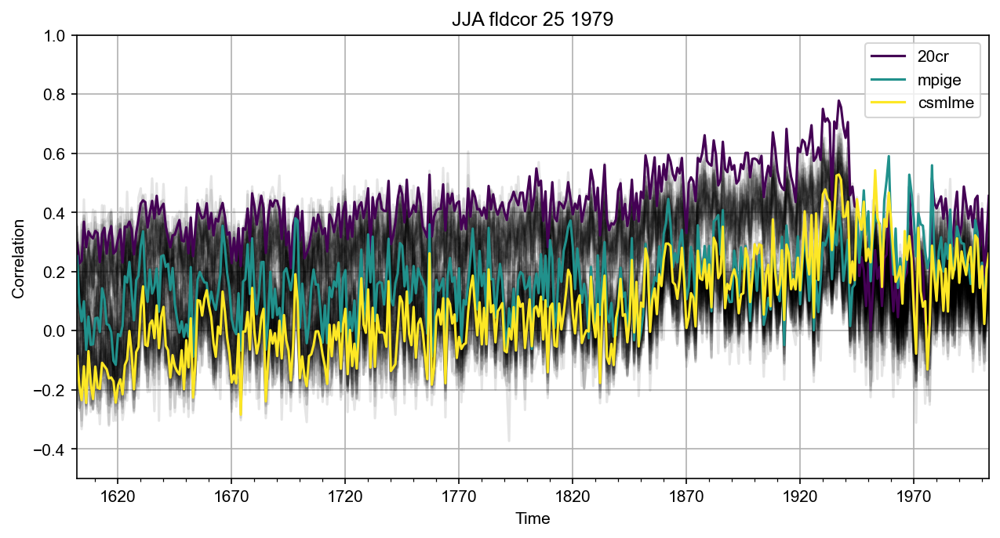

In [54]:
# 25 pseudo stations, one member. I prefer this figure as figure 1 b
plt.figure(figsize=(10, 5), dpi= 150)
dfmpige.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980',grid=1,style='k-', ax = plt.gca(),ylim=(-0.5,1), alpha=0.1,legend=False)
df20cr.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980',grid=1,style='k-', ax = plt.gca(),ylim=(-0.5,1), alpha=0.1,legend=False)
dfcsmlme.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980',grid=1,style='k-', ax = plt.gca(),ylim=(-0.5,1), alpha=0.1,legend=False)
dfJJA.plot(xlabel='Time', ylabel='Correlation', title='JJA fldcor 25 1979',grid=1,style='-',colormap=cm.viridis, ax = plt.gca(),ylim=(-0.5,1), alpha=1)




<AxesSubplot:title={'center':'JJA fldcor 25 1979'}, xlabel='Time', ylabel='Correlation'>

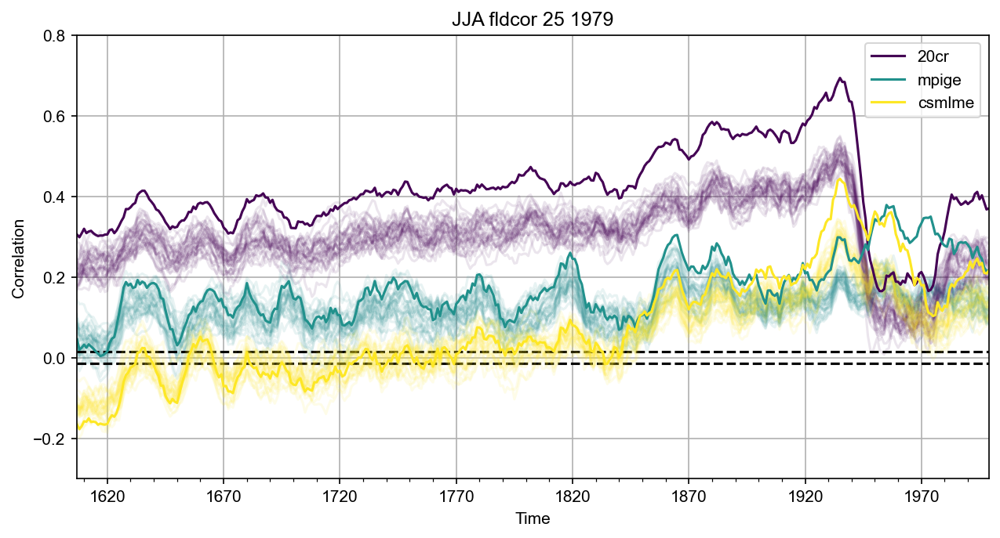

In [55]:
# 25 pseudo stations, one member. I prefer this figure as figure 1 b
plt.figure(figsize=(10, 5), dpi= 150)
dfmpige_rm10.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980',grid=1,color='#238A8DFF',style='-', ax = plt.gca(),ylim=(-0.3,0.8), alpha=0.1,legend=False)
signi_plus_ts.plot(xlabel='Time', ylabel='Correlation', title='JJA fldcor 25 1979',grid=1,style='k--', ax = plt.gca(),ylim=(-0.3,0.8), alpha=1,legend=False)
signi_minus_ts.plot(xlabel='Time', ylabel='Correlation', title='JJA fldcor 25 1979',grid=1,style='k--', ax = plt.gca(),ylim=(-0.3,0.8), alpha=1,legend=False)
df20cr_rm10.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980',grid=1,color='#440154FF',style='-', ax = plt.gca(),ylim=(-0.3,0.8), alpha=0.1,legend=False)
dfcsmlme_rm10.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980',grid=1,color='#FDE725FF',style='-', ax = plt.gca(),ylim=(-0.3,0.8), alpha=0.1,legend=False)
dfJJA_rm10.plot(xlabel='Time', ylabel='Correlation', title='JJA fldcor 25 1979',grid=1,style='-',colormap=cm.viridis, ax = plt.gca(),ylim=(-0.3,0.8), alpha=1)



In [56]:
arr = os.listdir(input_folder)
input_paths=[]
for file in os.listdir(input_folder):
    if file.endswith("_DJF_fldcor.nc"):
        input_folder_file=os.path.join(input_folder, file)
        input_paths.append(input_folder_file)
input_paths=sorted(input_paths)
len(input_paths)

90

In [57]:
input_paths_20cr=input_paths[0:30]
input_paths_csmlme=input_paths[30:60]
input_paths_mpige=input_paths[60:90]

In [58]:
emptyobject=[]

member_index_length = len(input_paths_mpige)

for i in range(member_index_length):
    ekf_RNN_mpige_fldcor_DJF = xr.open_dataset(input_paths_mpige[i])
    ekf_RNN_mpige_fldcor_DJF=ekf_RNN_mpige_fldcor_DJF.air_temperature.values[:,0,0]
    df_placeholder = pd.DataFrame(ekf_RNN_mpige_fldcor_DJF, index=pd.period_range('1603-01-16', '2003-12-16',freq="y"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(10, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



dfmpige = pd.concat(emptyobject,axis=1)




In [59]:
emptyobject=[]

member_index_length = len(input_paths_mpige)

for i in range(member_index_length):
    ekf_RNN_mpige_fldcor_DJF = xr.open_dataset(input_paths_mpige[i])
    ekf_RNN_mpige_fldcor_DJF=ekf_RNN_mpige_fldcor_DJF.air_temperature.values[:,0,0]
    
    # rolling mean computation

    ekf_RNN_mpige_fldcor_DJF_rm10=np.cumsum(ekf_RNN_mpige_fldcor_DJF, axis = 0)
    ekf_RNN_mpige_fldcor_DJF_rm10=ekf_RNN_mpige_fldcor_DJF_rm10/10
    ekf_RNN_mpige_fldcor_DJF_rm10[10:] -= ekf_RNN_mpige_fldcor_DJF_rm10[:-10]
    ekf_RNN_mpige_fldcor_DJF_rm10=ekf_RNN_mpige_fldcor_DJF_rm10[9:]

    
    df_placeholder = pd.DataFrame(ekf_RNN_mpige_fldcor_DJF_rm10, index=pd.period_range('1608-01-16', '1999-12-16',freq="y"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(10, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



dfmpige_rm10 = pd.concat(emptyobject,axis=1)





In [60]:
emptyobject=[]

member_index_length = len(input_paths_20cr)

for i in range(member_index_length):
    ekf_RNN_20cr_fldcor_DJF = xr.open_dataset(input_paths_20cr[i])
    ekf_RNN_20cr_fldcor_DJF=ekf_RNN_20cr_fldcor_DJF.air_temperature.values[:,0,0]
    df_placeholder = pd.DataFrame(ekf_RNN_20cr_fldcor_DJF, index=pd.period_range('1603-01-16', '2003-12-16',freq="y"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(10, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



df20cr = pd.concat(emptyobject,axis=1)





In [61]:
emptyobject=[]

member_index_length = len(input_paths_20cr)

for i in range(member_index_length):
    ekf_RNN_20cr_fldcor_DJF = xr.open_dataset(input_paths_20cr[i])
    ekf_RNN_20cr_fldcor_DJF=ekf_RNN_20cr_fldcor_DJF.air_temperature.values[:,0,0]
    
    # rolling mean computation

    ekf_RNN_20cr_fldcor_DJF_rm10=np.cumsum(ekf_RNN_20cr_fldcor_DJF, axis = 0)
    ekf_RNN_20cr_fldcor_DJF_rm10=ekf_RNN_20cr_fldcor_DJF_rm10/10
    ekf_RNN_20cr_fldcor_DJF_rm10[10:] -= ekf_RNN_20cr_fldcor_DJF_rm10[:-10]
    ekf_RNN_20cr_fldcor_DJF_rm10=ekf_RNN_20cr_fldcor_DJF_rm10[9:]

    
    df_placeholder = pd.DataFrame(ekf_RNN_20cr_fldcor_DJF_rm10, index=pd.period_range('1608-01-16', '1999-12-16',freq="y"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(10, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



df20cr_rm10 = pd.concat(emptyobject,axis=1)






In [62]:
emptyobject=[]

member_index_length = len(input_paths_csmlme)

for i in range(member_index_length):
    ekf_RNN_csmlme_fldcor_DJF = xr.open_dataset(input_paths_csmlme[i])
    ekf_RNN_csmlme_fldcor_DJF=ekf_RNN_csmlme_fldcor_DJF.air_temperature.values[:,0,0]
    df_placeholder = pd.DataFrame(ekf_RNN_csmlme_fldcor_DJF, index=pd.period_range('1603-01-16', '2003-12-16',freq="y"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(10, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



dfcsmlme = pd.concat(emptyobject,axis=1)






In [63]:
emptyobject=[]

member_index_length = len(input_paths_csmlme)

for i in range(member_index_length):
    ekf_RNN_csmlme_fldcor_DJF = xr.open_dataset(input_paths_csmlme[i])
    ekf_RNN_csmlme_fldcor_DJF=ekf_RNN_csmlme_fldcor_DJF.air_temperature.values[:,0,0]
    
    # rolling mean computation

    ekf_RNN_csmlme_fldcor_DJF_rm10=np.cumsum(ekf_RNN_csmlme_fldcor_DJF, axis = 0)
    ekf_RNN_csmlme_fldcor_DJF_rm10=ekf_RNN_csmlme_fldcor_DJF_rm10/10
    ekf_RNN_csmlme_fldcor_DJF_rm10[10:] -= ekf_RNN_csmlme_fldcor_DJF_rm10[:-10]
    ekf_RNN_csmlme_fldcor_DJF_rm10=ekf_RNN_csmlme_fldcor_DJF_rm10[9:]

    
    df_placeholder = pd.DataFrame(ekf_RNN_csmlme_fldcor_DJF_rm10, index=pd.period_range('1608-01-16', '1999-12-16',freq="y"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(10, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



dfcsmlme_rm10 = pd.concat(emptyobject,axis=1)







In [64]:
signi_plus=0.015
signi_minus=signi_plus*-1

signi_plus_ts=np.repeat(signi_plus, len(df_placeholder))
signi_plus_ts=pd.DataFrame(signi_plus_ts, index=pd.period_range('1608-01-16', '1999-12-16',freq="y"))

signi_minus_ts=np.repeat(signi_minus, len(df_placeholder))
signi_minus_ts=pd.DataFrame(signi_minus_ts, index=pd.period_range('1608-01-16', '1999-12-16',freq="y"))

<AxesSubplot:title={'center':'DJF fldcor 25 1979'}, xlabel='Time', ylabel='Correlation'>

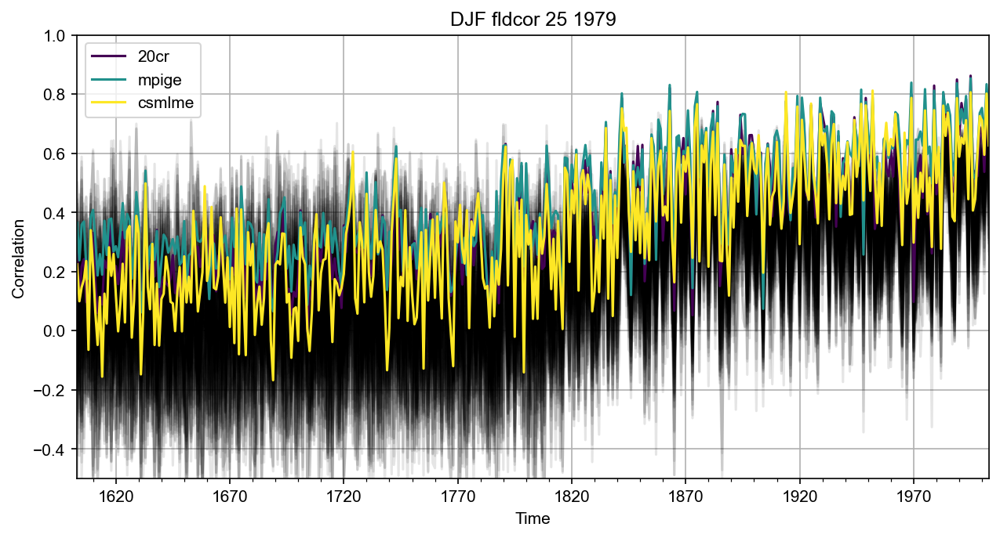

In [65]:
# 25 pseudo stations, one member. I prefer this figure as figure 1 b
plt.figure(figsize=(10, 5), dpi= 150)
dfmpige.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980',grid=1,style='k-', ax = plt.gca(),ylim=(-0.5,1), alpha=0.1,legend=False)
df20cr.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980',grid=1,style='k-', ax = plt.gca(),ylim=(-0.5,1), alpha=0.1,legend=False)
dfcsmlme.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980',grid=1,style='k-', ax = plt.gca(),ylim=(-0.5,1), alpha=0.1,legend=False)
dfDJF.plot(xlabel='Time', ylabel='Correlation', title='DJF fldcor 25 1979',grid=1,style='-',colormap=cm.viridis, ax = plt.gca(),ylim=(-0.5,1), alpha=1)




<AxesSubplot:title={'center':'DJF fldcor 25 1979'}, xlabel='Time', ylabel='Correlation'>

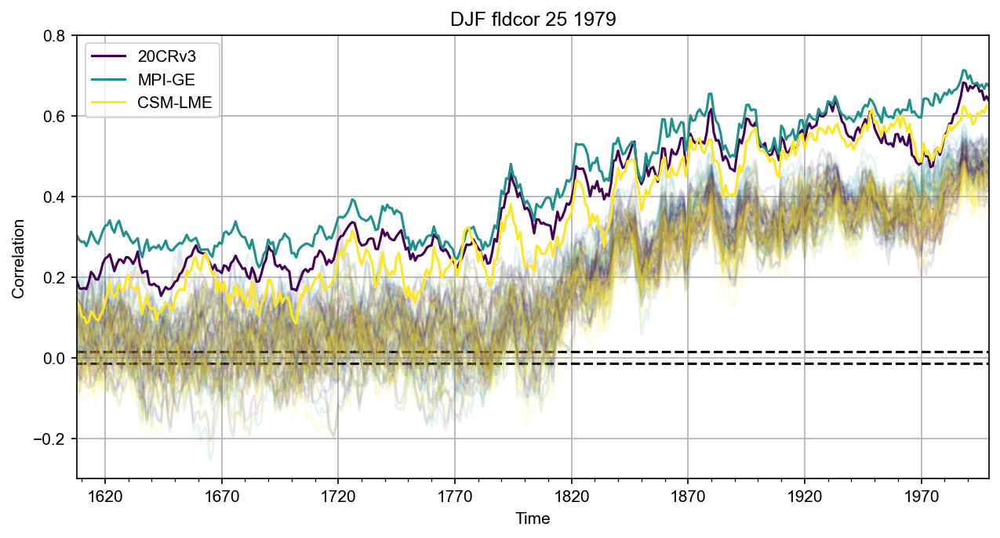

In [66]:
# 25 pseudo stations, one member. I prefer this figure as figure 1 b
plt.figure(figsize=(10, 5), dpi= 150)
dfmpige_rm10.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980',grid=1,color='#238A8DFF',style='-', ax = plt.gca(),ylim=(-0.3,0.8), alpha=0.1,legend=False)
signi_plus_ts.plot(xlabel='Time', ylabel='Correlation', title='DJF fldcor 25 1979',grid=1,style='k--', ax = plt.gca(),ylim=(-0.3,0.8), alpha=1,legend=False)
signi_minus_ts.plot(xlabel='Time', ylabel='Correlation', title='DJF fldcor 25 1979',grid=1,style='k--', ax = plt.gca(),ylim=(-0.3,0.8), alpha=1,legend=False)
df20cr_rm10.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980',grid=1,color='#440154FF',style='-', ax = plt.gca(),ylim=(-0.3,0.8), alpha=0.1,legend=False)
dfcsmlme_rm10.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980',grid=1,color='#FDE725FF',style='-', ax = plt.gca(),ylim=(-0.3,0.8), alpha=0.1,legend=False)
dfDJF_rm10.plot(xlabel='Time', ylabel='Correlation', title='DJF fldcor 25 1979',grid=1,style='-',colormap=cm.viridis, ax = plt.gca(),ylim=(-0.3,0.8), alpha=1)




In [67]:
#### rmse and global temperature

In [68]:
#rmse_cnn_space=xs.rmse(obs, fct, dim=["lat", "lon"])
#rmse_regs_space=xs.rmse(obs, fct2, dim=["lat", "lon"])

In [69]:
arr = os.listdir(input_folder)
input_paths=[]
for file in os.listdir(input_folder):
    if file.startswith("fldmean_best"):
        input_folder_file=os.path.join(input_folder, file)
        input_paths.append(input_folder_file)
input_paths=sorted(input_paths)
len(input_paths)

120

In [70]:
input_paths_ekf400=input_paths[0:30]
input_paths_20cr=input_paths[30:60]
input_paths_csmlme=input_paths[60:90]
input_paths_mpige=input_paths[90:120]

In [71]:
input_paths_mpige

['/Users/mwegmann/Documents/small_spark/figure_data/fldmean_best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_mem01_monthly.nc',
 '/Users/mwegmann/Documents/small_spark/figure_data/fldmean_best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_mem02_monthly.nc',
 '/Users/mwegmann/Documents/small_spark/figure_data/fldmean_best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_mem03_monthly.nc',
 '/Users/mwegmann/Documents/small_spark/figure_data/fldmean_best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_mem04_monthly.nc',
 '/Users/mwegmann/Documents/small_spark/figure_data/fldmean_best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_mem05_monthly.nc',
 '/Users/mwegmann/Documents/small_spark/figure_data/fldmean_best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_mem06_monthly.nc',
 '/Users/mwegmann/Documents/small_spark/figure_data/fldmean_best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_mem07_monthly.nc',
 '/Users/mwegmann/Documents/small_spark/figure_data/fldmean_be

In [72]:
emptyobject=[]

member_index_length = len(input_paths_20cr)

for i in range(member_index_length):
    ekf_RNN_20cr_fldmean_mon = xr.open_dataset(input_paths_20cr[i],decode_times=False)
    ekf_RNN_20cr_fldmean_mon=ekf_RNN_20cr_fldmean_mon.t2m.values[:,0,0]
    
    # rolling mean computation

    ekf_RNN_20cr_fldmean_mon_rm12=np.cumsum(ekf_RNN_20cr_fldmean_mon, axis = 0)
    ekf_RNN_20cr_fldmean_mon_rm12=ekf_RNN_20cr_fldmean_mon_rm12/12
    ekf_RNN_20cr_fldmean_mon_rm12[12:] -= ekf_RNN_20cr_fldmean_mon_rm12[:-12]
    ekf_RNN_20cr_fldmean_mon_rm12=ekf_RNN_20cr_fldmean_mon_rm12[11:]

    
    df_placeholder = pd.DataFrame(ekf_RNN_20cr_fldmean_mon_rm12, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(12, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



df20cr_rm12 = pd.concat(emptyobject,axis=1)







In [73]:
emptyobject=[]

member_index_length = len(input_paths_mpige)

for i in range(member_index_length):
    ekf_RNN_mpige_fldmean_mon = xr.open_dataset(input_paths_mpige[i],decode_times=False)
    ekf_RNN_mpige_fldmean_mon=ekf_RNN_mpige_fldmean_mon.t2m.values[:,0,0]
    
    # rolling mean computation

    ekf_RNN_mpige_fldmean_mon_rm12=np.cumsum(ekf_RNN_mpige_fldmean_mon, axis = 0)
    ekf_RNN_mpige_fldmean_mon_rm12=ekf_RNN_mpige_fldmean_mon_rm12/12
    ekf_RNN_mpige_fldmean_mon_rm12[12:] -= ekf_RNN_mpige_fldmean_mon_rm12[:-12]
    ekf_RNN_mpige_fldmean_mon_rm12=ekf_RNN_mpige_fldmean_mon_rm12[11:]

    
    df_placeholder = pd.DataFrame(ekf_RNN_mpige_fldmean_mon_rm12, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(12, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



dfmpige_rm12 = pd.concat(emptyobject,axis=1)








In [74]:
emptyobject=[]

member_index_length = len(input_paths_csmlme)

for i in range(member_index_length):
    ekf_RNN_csmlme_fldmean_mon = xr.open_dataset(input_paths_csmlme[i],decode_times=False)
    ekf_RNN_csmlme_fldmean_mon=ekf_RNN_csmlme_fldmean_mon.t2m.values[:,0,0]
    
    # rolling mean computation

    ekf_RNN_csmlme_fldmean_mon_rm12=np.cumsum(ekf_RNN_csmlme_fldmean_mon, axis = 0)
    ekf_RNN_csmlme_fldmean_mon_rm12=ekf_RNN_csmlme_fldmean_mon_rm12/12
    ekf_RNN_csmlme_fldmean_mon_rm12[12:] -= ekf_RNN_csmlme_fldmean_mon_rm12[:-12]
    ekf_RNN_csmlme_fldmean_mon_rm12=ekf_RNN_csmlme_fldmean_mon_rm12[11:]

    
    df_placeholder = pd.DataFrame(ekf_RNN_csmlme_fldmean_mon_rm12, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(12, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



dfcsmlme_rm12 = pd.concat(emptyobject,axis=1)









In [75]:
emptyobject=[]

member_index_length = len(input_paths_ekf400)

for i in range(member_index_length):
    ekf_RNN_ekf400_fldmean_mon = xr.open_dataset(input_paths_ekf400[i])
    ekf_RNN_ekf400_fldmean_mon=ekf_RNN_ekf400_fldmean_mon.air_temperature.values[:,0,0]
    
    # rolling mean computation

    ekf_RNN_ekf400_fldmean_mon_rm12=np.cumsum(ekf_RNN_ekf400_fldmean_mon, axis = 0)
    ekf_RNN_ekf400_fldmean_mon_rm12=ekf_RNN_ekf400_fldmean_mon_rm12/12
    ekf_RNN_ekf400_fldmean_mon_rm12[12:] -= ekf_RNN_ekf400_fldmean_mon_rm12[:-12]
    ekf_RNN_ekf400_fldmean_mon_rm12=ekf_RNN_ekf400_fldmean_mon_rm12[11:]

    
    df_placeholder = pd.DataFrame(ekf_RNN_ekf400_fldmean_mon_rm12, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(12, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



dfekf400_rm12 = pd.concat(emptyobject,axis=1)










<AxesSubplot:title={'center':'Global mean T2m anomalies wrt 1951-1980'}, xlabel='Time', ylabel='[K]'>

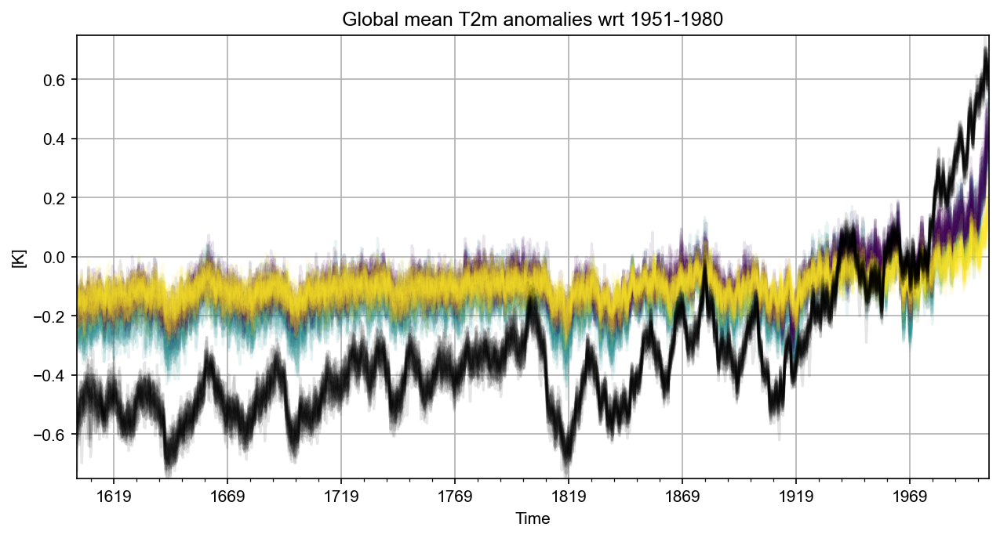

In [76]:
plt.figure(figsize=(10, 5), dpi= 150)
dfmpige_rm12.plot(xlabel='Time', ylabel='[K]', title='Global mean T2m anomalies wrt 1951-1980',grid=1,color='#238A8DFF',style='-', ax = plt.gca(),ylim=(-0.75,0.75), alpha=0.1,legend=False)
df20cr_rm12.plot(xlabel='Time', ylabel='[K]', title='Global mean T2m anomalies wrt 1951-1980',grid=1,color='#440154FF',style='-', ax = plt.gca(),ylim=(-0.75,0.75), alpha=0.1,legend=False)
dfcsmlme_rm12.plot(xlabel='Time', ylabel='[K]', title='Global mean T2m anomalies wrt 1951-1980',grid=1,color='#FDE725FF',style='-', ax = plt.gca(),ylim=(-0.75,0.75), alpha=0.1,legend=False)
dfekf400_rm12.plot(xlabel='Time', ylabel='[K]', title='Global mean T2m anomalies wrt 1951-1980',grid=1,style='k-', ax = plt.gca(),ylim=(-0.75,0.75), alpha=0.1,legend=False)











In [77]:
arr = os.listdir(input_folder)
input_paths=[]
for file in os.listdir(input_folder):
    if file.startswith("fldmean_NH"):
        input_folder_file=os.path.join(input_folder, file)
        input_paths.append(input_folder_file)
input_paths=sorted(input_paths)
len(input_paths)

120

In [78]:
input_paths_ekf400=input_paths[0:30]
input_paths_20cr=input_paths[30:60]
input_paths_csmlme=input_paths[60:90]
input_paths_mpige=input_paths[90:120]

In [79]:
emptyobject=[]

member_index_length = len(input_paths_20cr)

for i in range(member_index_length):
    ekf_RNN_20cr_fldmean_mon = xr.open_dataset(input_paths_20cr[i],decode_times=False)
    ekf_RNN_20cr_fldmean_mon=ekf_RNN_20cr_fldmean_mon.t2m.values[:,0,0]
    
    # rolling mean computation

    ekf_RNN_20cr_fldmean_mon_rm12=np.cumsum(ekf_RNN_20cr_fldmean_mon, axis = 0)
    ekf_RNN_20cr_fldmean_mon_rm12=ekf_RNN_20cr_fldmean_mon_rm12/12
    ekf_RNN_20cr_fldmean_mon_rm12[12:] -= ekf_RNN_20cr_fldmean_mon_rm12[:-12]
    ekf_RNN_20cr_fldmean_mon_rm12=ekf_RNN_20cr_fldmean_mon_rm12[11:]

    
    df_placeholder = pd.DataFrame(ekf_RNN_20cr_fldmean_mon_rm12, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(12, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



df20cr_rm12 = pd.concat(emptyobject,axis=1)



In [80]:
emptyobject=[]

member_index_length = len(input_paths_mpige)

for i in range(member_index_length):
    ekf_RNN_mpige_fldmean_mon = xr.open_dataset(input_paths_mpige[i],decode_times=False)
    ekf_RNN_mpige_fldmean_mon=ekf_RNN_mpige_fldmean_mon.t2m.values[:,0,0]
    
    # rolling mean computation

    ekf_RNN_mpige_fldmean_mon_rm12=np.cumsum(ekf_RNN_mpige_fldmean_mon, axis = 0)
    ekf_RNN_mpige_fldmean_mon_rm12=ekf_RNN_mpige_fldmean_mon_rm12/12
    ekf_RNN_mpige_fldmean_mon_rm12[12:] -= ekf_RNN_mpige_fldmean_mon_rm12[:-12]
    ekf_RNN_mpige_fldmean_mon_rm12=ekf_RNN_mpige_fldmean_mon_rm12[11:]

    
    df_placeholder = pd.DataFrame(ekf_RNN_mpige_fldmean_mon_rm12, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(12, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



dfmpige_rm12 = pd.concat(emptyobject,axis=1)


In [81]:
emptyobject=[]

member_index_length = len(input_paths_csmlme)

for i in range(member_index_length):
    ekf_RNN_csmlme_fldmean_mon = xr.open_dataset(input_paths_csmlme[i],decode_times=False)
    ekf_RNN_csmlme_fldmean_mon=ekf_RNN_csmlme_fldmean_mon.t2m.values[:,0,0]
    
    # rolling mean computation

    ekf_RNN_csmlme_fldmean_mon_rm12=np.cumsum(ekf_RNN_csmlme_fldmean_mon, axis = 0)
    ekf_RNN_csmlme_fldmean_mon_rm12=ekf_RNN_csmlme_fldmean_mon_rm12/12
    ekf_RNN_csmlme_fldmean_mon_rm12[12:] -= ekf_RNN_csmlme_fldmean_mon_rm12[:-12]
    ekf_RNN_csmlme_fldmean_mon_rm12=ekf_RNN_csmlme_fldmean_mon_rm12[11:]

    
    df_placeholder = pd.DataFrame(ekf_RNN_csmlme_fldmean_mon_rm12, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(12, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



dfcsmlme_rm12 = pd.concat(emptyobject,axis=1)

In [82]:
emptyobject=[]

member_index_length = len(input_paths_ekf400)

for i in range(member_index_length):
    ekf_RNN_ekf400_fldmean_mon = xr.open_dataset(input_paths_ekf400[i])
    ekf_RNN_ekf400_fldmean_mon=ekf_RNN_ekf400_fldmean_mon.air_temperature.values[:,0,0]
    
    # rolling mean computation

    ekf_RNN_ekf400_fldmean_mon_rm12=np.cumsum(ekf_RNN_ekf400_fldmean_mon, axis = 0)
    ekf_RNN_ekf400_fldmean_mon_rm12=ekf_RNN_ekf400_fldmean_mon_rm12/12
    ekf_RNN_ekf400_fldmean_mon_rm12[12:] -= ekf_RNN_ekf400_fldmean_mon_rm12[:-12]
    ekf_RNN_ekf400_fldmean_mon_rm12=ekf_RNN_ekf400_fldmean_mon_rm12[11:]

    
    df_placeholder = pd.DataFrame(ekf_RNN_ekf400_fldmean_mon_rm12, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(12, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



dfekf400_rm12 = pd.concat(emptyobject,axis=1)

<AxesSubplot:title={'center':'NH mean T2m anomalies wrt 1951-1980'}, xlabel='Time', ylabel='[K]'>

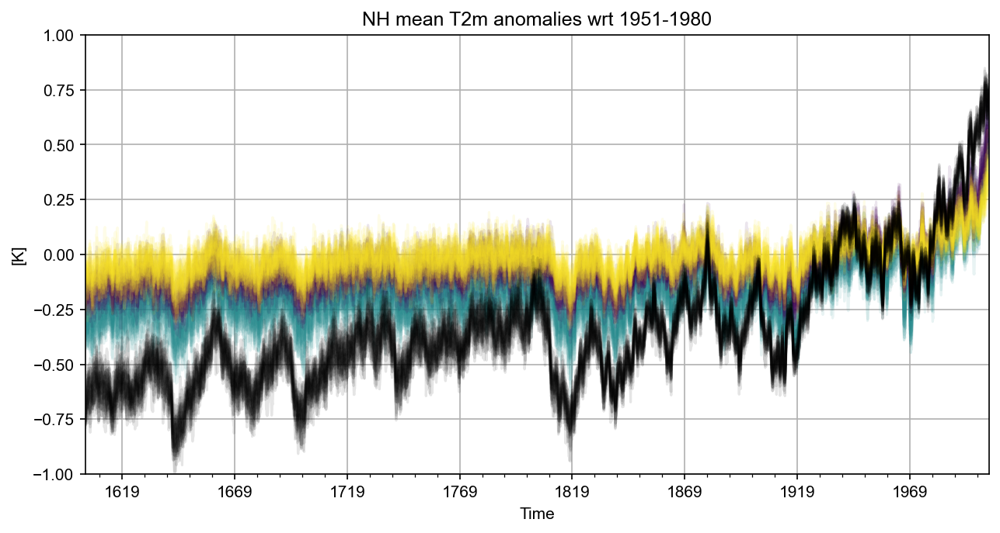

In [83]:
plt.figure(figsize=(10, 5), dpi= 150)
dfmpige_rm12.plot(xlabel='Time', ylabel='[K]', title='NH mean T2m anomalies wrt 1951-1980',grid=1,color='#238A8DFF',style='-', ax = plt.gca(),ylim=(-1,1), alpha=0.1,legend=False)
df20cr_rm12.plot(xlabel='Time', ylabel='[K]', title='NH mean T2m anomalies wrt 1951-1980',grid=1,color='#440154FF',style='-', ax = plt.gca(),ylim=(-1,1), alpha=0.1,legend=False)
dfcsmlme_rm12.plot(xlabel='Time', ylabel='[K]', title='NH mean T2m anomalies wrt 1951-1980',grid=1,color='#FDE725FF',style='-', ax = plt.gca(),ylim=(-1,1), alpha=0.1,legend=False)
dfekf400_rm12.plot(xlabel='Time', ylabel='[K]', title='NH mean T2m anomalies wrt 1951-1980',grid=1,style='k-', ax = plt.gca(),ylim=(-1,1), alpha=0.1,legend=False)


In [84]:
# climcal4.giub.unibe.ch:/scratch3/martinw/rnn/figure_data/
input_folder_temp="/Volumes/SPARK/RNN_savestates/"
input_folder_ekf400="/Volumes/SPARK/ekf400v2/member/"

In [85]:
arr = os.listdir(input_folder_temp)
input_paths_20cr_rec=[]
for file in os.listdir(input_folder_temp):
    if file.startswith("best_model_ekf400m_anoms_20cr_lowres_25_1979_RNN1lstm_mem"):
        input_folder_file=os.path.join(input_folder_temp, file)
        input_paths_20cr_rec.append(input_folder_file)
input_paths_20cr_rec=sorted(input_paths_20cr_rec)
len(input_paths_20cr_rec)

30

In [86]:
input_paths_20cr_rec

['/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_20cr_lowres_25_1979_RNN1lstm_mem01_monthly.nc',
 '/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_20cr_lowres_25_1979_RNN1lstm_mem02_monthly.nc',
 '/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_20cr_lowres_25_1979_RNN1lstm_mem03_monthly.nc',
 '/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_20cr_lowres_25_1979_RNN1lstm_mem04_monthly.nc',
 '/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_20cr_lowres_25_1979_RNN1lstm_mem05_monthly.nc',
 '/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_20cr_lowres_25_1979_RNN1lstm_mem06_monthly.nc',
 '/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_20cr_lowres_25_1979_RNN1lstm_mem07_monthly.nc',
 '/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_20cr_lowres_25_1979_RNN1lstm_mem08_monthly.nc',
 '/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_20cr_lowres_25_1979_RNN1lstm_mem09_monthly.nc',
 '/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anom

In [87]:
arr = os.listdir(input_folder_temp)
input_paths_mpige_rec=[]
for file in os.listdir(input_folder_temp):
    if file.startswith("best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_mem"):
        input_folder_file=os.path.join(input_folder_temp, file)
        input_paths_mpige_rec.append(input_folder_file)
input_paths_mpige_rec=sorted(input_paths_mpige_rec)
len(input_paths_mpige_rec)

30

In [88]:
arr = os.listdir(input_folder_temp)
input_paths_csmlme_rec=[]
for file in os.listdir(input_folder_temp):
    if file.startswith("best_model_ekf400m_anoms_csmlme_lowres_25_1979_RNN1lstm_mem"):
        input_folder_file=os.path.join(input_folder_temp, file)
        input_paths_csmlme_rec.append(input_folder_file)
input_paths_csmlme_rec=sorted(input_paths_csmlme_rec)
len(input_paths_csmlme_rec)

30

In [89]:
arr = os.listdir(input_folder_ekf400)
input_paths_ekf400=[]
for file in os.listdir(input_folder_ekf400):
    if file.endswith("allyears_t2m_anoms.nc"):
        input_folder_file=os.path.join(input_folder_ekf400, file)
        input_paths_ekf400.append(input_folder_file)
input_paths_ekf400=sorted(input_paths_ekf400)
len(input_paths_ekf400)

30

In [90]:
emptyobject=[]

member_index_length = len(input_paths_csmlme)

for i in range(member_index_length):
    print(i)
    ekf400_mon = xr.open_dataset(input_paths_ekf400[i])
    ekf400_mon=ekf400_mon.air_temperature
    tcr_rec_mon = xr.open_dataset(input_paths_20cr_rec[i],decode_times=False)
    tcr_rec_mon=tcr_rec_mon.t2m
    #rmse_cnn_space=xs.rmse(ekf400_mon, tcr_rec_mon, dim=["lat", "lon"])
    rmse=np.sqrt(np.mean((tcr_rec_mon.values-ekf400_mon.values)**2,axis=(1, 2)))


    
    rmse_cnn_space_rm12=np.cumsum(rmse, axis = 0)
    rmse_cnn_space_rm12=rmse_cnn_space_rm12/12
    rmse_cnn_space_rm12[12:] -= rmse_cnn_space_rm12[:-12]
    rmse_cnn_space_rm12=rmse_cnn_space_rm12[11:]

    
    df_placeholder = pd.DataFrame(rmse_cnn_space_rm12, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(12, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)

df20crrmse_rm12 = pd.concat(emptyobject,axis=1)



    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29


In [91]:
df20crrmse_rm12.shape

(4813, 30)

In [92]:
emptyobject=[]

member_index_length = len(input_paths_csmlme)

for i in range(member_index_length):
    print(i)
    ekf400_mon = xr.open_dataset(input_paths_ekf400[i])
    ekf400_mon=ekf400_mon.air_temperature
    mpige_rec_mon = xr.open_dataset(input_paths_mpige_rec[i],decode_times=False)
    mpige_rec_mon=mpige_rec_mon.t2m
    rmse=np.sqrt(np.mean((mpige_rec_mon.values-ekf400_mon.values)**2,axis=(1, 2)))
    
    
    rmse_cnn_space_rm12=np.cumsum(rmse, axis = 0)
    rmse_cnn_space_rm12=rmse_cnn_space_rm12/12
    rmse_cnn_space_rm12[12:] -= rmse_cnn_space_rm12[:-12]
    rmse_cnn_space_rm12=rmse_cnn_space_rm12[11:]

    
    df_placeholder = pd.DataFrame(rmse_cnn_space_rm12, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(12, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)

dfmpigermse_rm12 = pd.concat(emptyobject,axis=1)



    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29


In [93]:
emptyobject=[]

member_index_length = len(input_paths_csmlme)

for i in range(member_index_length):
    print(i)
    ekf400_mon = xr.open_dataset(input_paths_ekf400[i])
    ekf400_mon=ekf400_mon.air_temperature
    csmlme_rec_mon = xr.open_dataset(input_paths_csmlme_rec[i],decode_times=False)
    csmlme_rec_mon=csmlme_rec_mon.t2m
    rmse=np.sqrt(np.mean((mpige_rec_mon.values-ekf400_mon.values)**2,axis=(1, 2)))


    
    rmse_cnn_space_rm12=np.cumsum(rmse, axis = 0)
    rmse_cnn_space_rm12=rmse_cnn_space_rm12/12
    rmse_cnn_space_rm12[12:] -= rmse_cnn_space_rm12[:-12]
    rmse_cnn_space_rm12=rmse_cnn_space_rm12[11:]

    
    df_placeholder = pd.DataFrame(rmse_cnn_space_rm12, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    emptyobject.append(df_placeholder)
    #plt.figure(figsize=(12, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)

dfcsmlmermse_rm12 = pd.concat(emptyobject,axis=1)



    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29


<AxesSubplot:title={'center':'Global mean RMSE wrt to EKF400 anomalies'}, xlabel='Time', ylabel='[K]'>

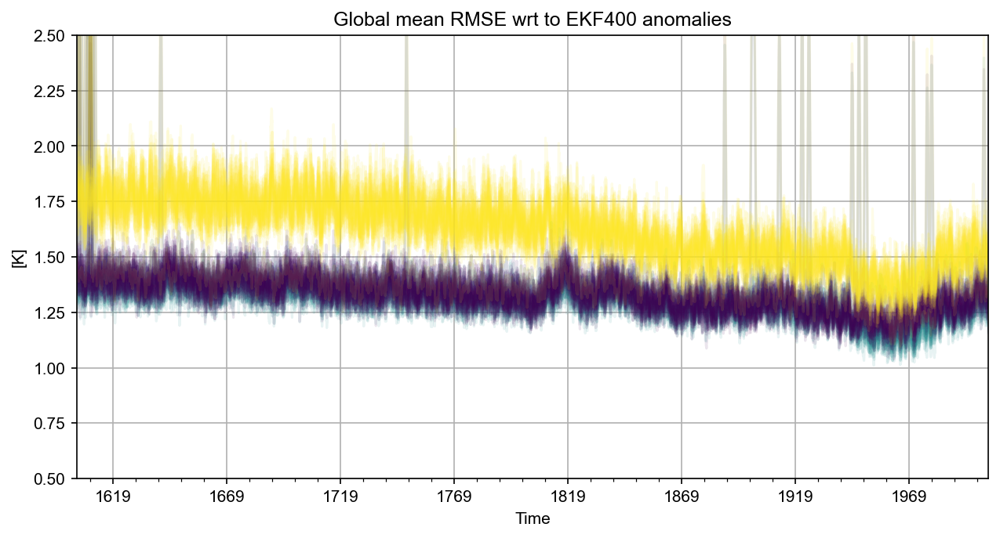

In [94]:
plt.figure(figsize=(10, 5), dpi= 150)
dfmpigermse_rm12.plot(xlabel='Time', ylabel='[K]', title='Global mean RMSE wrt to EKF400 anomalies',grid=1,color='#238A8DFF',style='-', ax = plt.gca(),ylim=(0.5,2.5), alpha=0.1,legend=False)
df20crrmse_rm12.plot(xlabel='Time', ylabel='[K]', title='Global mean RMSE wrt to EKF400 anomalies',grid=1,color='#440154FF',style='-', ax = plt.gca(),ylim=(0.5,2.5), alpha=0.1,legend=False)
dfcsmlmermse_rm12.plot(xlabel='Time', ylabel='[K]', title='Global mean RMSE wrt to EKF400 anomalies',grid=1,color='#FDE725FF',style='-', ax = plt.gca(),ylim=(0.5,2.5), alpha=0.1,legend=False)












In [95]:
#### correlation

In [96]:
#emptyobject=[]

#member_index_length = len(input_paths_csmlme)

#for i in range(member_index_length):
#    ekf400_mon = xr.open_dataset(input_paths_ekf400[i])
#    ekf400_mon=ekf400_mon.air_temperature
#    tcr_rec_mon = xr.open_dataset(input_paths_20cr_rec[i])
#    tcr_rec_mon=tcr_rec_mon.t2m
#    rmse_cnn_space=xs.pearson_r(ekf400_mon[0:10,:,:], tcr_rec_mon[0:10,:,:], dim=["time"])
    
#    
#    rmse_cnn_space_rm12.append(rmse_cnn_space.mean())
#    df_placeholder = pd.DataFrame(rmse_cnn_space_rm12, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))
#    emptyobject.append(df_placeholder)

#df20crrmse_rm12 = pd.concat(emptyobject,axis=1)



    

## Figure 4

In [97]:

### monthly resolution and NH
rec_20cr_enstd_monthly_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_20cr_lowres_25_1979_RNN1lstm_ensstd_monthly.nc",decode_times=False)
rec_20cr_enstd_monthly_fldmean=rec_20cr_enstd_monthly_fldmean.t2m[:,0,0]

### monthly resolution and NH
rec_mpige_enstd_monthly_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_ensstd_monthly.nc",decode_times=False)
rec_mpige_enstd_monthly_fldmean=rec_mpige_enstd_monthly_fldmean.t2m[:,0,0]

### monthly resolution and NH
rec_csmlme_enstd_monthly_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_csmlme_lowres_25_1979_RNN1lstm_ensstd_monthly.nc",decode_times=False)
rec_csmlme_enstd_monthly_fldmean=rec_csmlme_enstd_monthly_fldmean.t2m[:,0,0]



ekf_enstd_monthly_fldmean = xr.open_dataset("/Volumes/SPARK/ekf400v2/ensmean/EKF400v2_ensstd_allyears_t2m_anoms_fldmean.nc",decode_times=False)
ekf_enstd_monthly_fldmean=ekf_enstd_monthly_fldmean.air_temperature[:,0,0]
df_20cr = pd.DataFrame({"20cr": rec_20cr_enstd_monthly_fldmean}, index=pd.period_range('1602-01-16', '2003-12-16',freq="m"))
df_mpige = pd.DataFrame({"mpige": rec_mpige_enstd_monthly_fldmean}, index=pd.period_range('1602-01-16', '2003-12-16',freq="m"))
df_csmlme = pd.DataFrame({"csmlme": rec_csmlme_enstd_monthly_fldmean}, index=pd.period_range('1602-01-16', '2003-12-16',freq="m"))



df_ekf400 = pd.DataFrame({"ekf400": ekf_enstd_monthly_fldmean}, index=pd.period_range('1602-01-16', '2003-12-16',freq="m"))

#air.2m.mon.mean_monanom.nc

<AxesSubplot:title={'center':'Ensemble Standard Deviation'}, xlabel='Time', ylabel='[K]'>

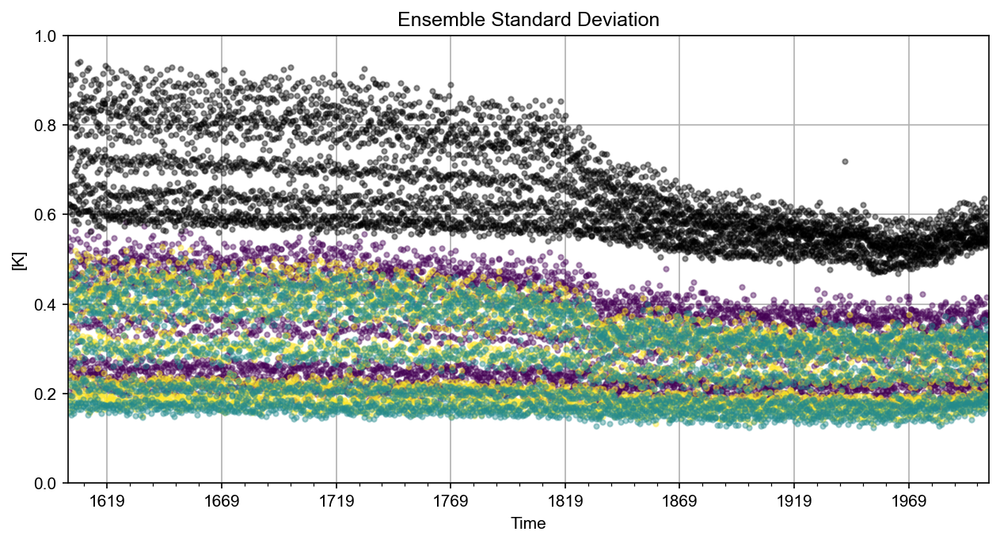

In [98]:
plt.figure(figsize=(10, 5), dpi= 150)
df_20cr.plot(xlabel='Time', ylabel='[K]', title='Ensemble Standard Deviation',grid=1,style='.' ,color='#440154FF',ax = plt.gca(),ylim=(0,1), alpha=0.4,legend=False)
df_csmlme.plot(xlabel='Time', ylabel='[K]', title='Ensemble Standard Deviation',grid=1,color='#FDE725FF',style='.', ax = plt.gca(),ylim=(0,1), alpha=0.4,legend=False)
df_mpige.plot(xlabel='Time', ylabel='[K]', title='Ensemble Standard Deviation',grid=1,color='#238A8DFF',style='.', ax = plt.gca(),ylim=(0,1), alpha=0.4,legend=False)
df_ekf400.plot(xlabel='Time', ylabel='[K]', title='Ensemble Standard Deviation',grid=1,style='k.', ax = plt.gca(),ylim=(0,1), alpha=0.4,legend=False)















In [99]:

### monthly resolution and NH
rec_20cr_enstd_monthly_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_20cr_lowres_25_1979_RNN1lstm_ensstd_monthly.nc",decode_times=False)
rec_20cr_enstd_monthly_fldmean=rec_20cr_enstd_monthly_fldmean.t2m[:,0,0]

ekf_RNN_20cr_fldmean_mon_rm12=np.cumsum(rec_20cr_enstd_monthly_fldmean.values, axis = 0)
ekf_RNN_20cr_fldmean_mon_rm12=ekf_RNN_20cr_fldmean_mon_rm12/12
ekf_RNN_20cr_fldmean_mon_rm12[12:] -= ekf_RNN_20cr_fldmean_mon_rm12[:-12]
ekf_RNN_20cr_fldmean_mon_rm12=ekf_RNN_20cr_fldmean_mon_rm12[11:]

### monthly resolution and NH
rec_mpige_enstd_monthly_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_ensstd_monthly.nc",decode_times=False)
rec_mpige_enstd_monthly_fldmean=rec_mpige_enstd_monthly_fldmean.t2m[:,0,0]

ekf_RNN_mpige_fldmean_mon_rm12=np.cumsum(rec_mpige_enstd_monthly_fldmean.values, axis = 0)
ekf_RNN_mpige_fldmean_mon_rm12=ekf_RNN_mpige_fldmean_mon_rm12/12
ekf_RNN_mpige_fldmean_mon_rm12[12:] -= ekf_RNN_mpige_fldmean_mon_rm12[:-12]
ekf_RNN_mpige_fldmean_mon_rm12=ekf_RNN_mpige_fldmean_mon_rm12[11:]



### monthly resolution and NH
rec_csmlme_enstd_monthly_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400m_anoms_csmlme_lowres_25_1979_RNN1lstm_ensstd_monthly.nc",decode_times=False)
rec_csmlme_enstd_monthly_fldmean=rec_csmlme_enstd_monthly_fldmean.t2m[:,0,0]


ekf_RNN_csmlme_fldmean_mon_rm12=np.cumsum(rec_csmlme_enstd_monthly_fldmean.values, axis = 0)
ekf_RNN_csmlme_fldmean_mon_rm12=ekf_RNN_csmlme_fldmean_mon_rm12/12
ekf_RNN_csmlme_fldmean_mon_rm12[12:] -= ekf_RNN_csmlme_fldmean_mon_rm12[:-12]
ekf_RNN_csmlme_fldmean_mon_rm12=ekf_RNN_csmlme_fldmean_mon_rm12[11:]





ekf_enstd_monthly_fldmean = xr.open_dataset("/Volumes/SPARK/ekf400v2/ensmean/EKF400v2_ensstd_allyears_t2m_anoms_fldmean.nc",decode_times=False)
ekf_enstd_monthly_fldmean=ekf_enstd_monthly_fldmean.air_temperature[:,0,0]

ekf_fldmean_mon_rm12=np.cumsum(ekf_enstd_monthly_fldmean.values, axis = 0)
ekf_fldmean_mon_rm12=ekf_fldmean_mon_rm12/12
ekf_fldmean_mon_rm12[12:] -= ekf_fldmean_mon_rm12[:-12]
ekf_fldmean_mon_rm12=ekf_fldmean_mon_rm12[11:]


df_20cr = pd.DataFrame({"20cr": ekf_RNN_20cr_fldmean_mon_rm12}, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))
df_mpige = pd.DataFrame({"mpige": ekf_RNN_mpige_fldmean_mon_rm12}, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))
df_csmlme = pd.DataFrame({"csmlme": ekf_RNN_csmlme_fldmean_mon_rm12}, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))



df_ekf400 = pd.DataFrame({"ekf400": ekf_fldmean_mon_rm12}, index=pd.period_range('1602-12-16', '2003-12-16',freq="m"))






#air.2m.mon.mean_monanom.nc

<AxesSubplot:title={'center':'Running mean Ensemble Standard Deviation'}, xlabel='Time', ylabel='[K]'>

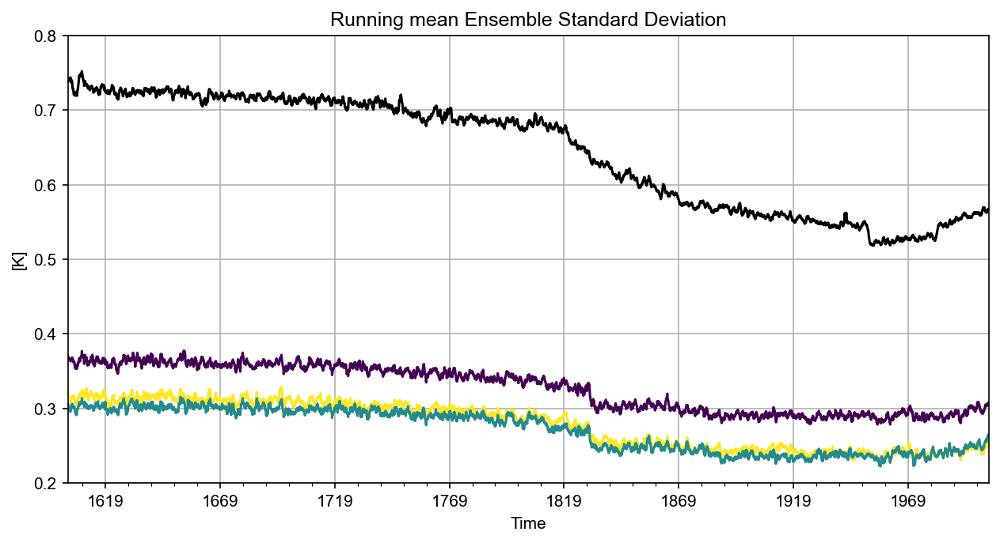

In [100]:
plt.figure(figsize=(10, 5), dpi= 150)
df_20cr.plot(xlabel='Time', ylabel='[K]', title='Running mean Ensemble Standard Deviation',grid=1,style='-' ,color='#440154FF',ax = plt.gca(),ylim=(0.2,0.8), alpha=1,legend=False)
df_csmlme.plot(xlabel='Time', ylabel='[K]', title='Running mean Ensemble Standard Deviation',grid=1,color='#FDE725FF',style='-', ax = plt.gca(),ylim=(0.2,0.8), alpha=1,legend=False)
df_mpige.plot(xlabel='Time', ylabel='[K]', title='Running mean Ensemble Standard Deviation',grid=1,color='#238A8DFF',style='-', ax = plt.gca(),ylim=(0.2,0.8), alpha=1,legend=False)
df_ekf400.plot(xlabel='Time', ylabel='[K]', title='Running mean Ensemble Standard Deviation',grid=1,style='k-', ax = plt.gca(),ylim=(0.2,0.8), alpha=1,legend=False)
















In [101]:
ekf_enstd_monthly_fldmean = xr.open_dataset("/Volumes/SPARK/ekf400v2/ensmean/EKF400_ensmean_v2.0_t2m_anoms.nc",decode_times=False)
ekf_enstd_monthly_fldmean=ekf_enstd_monthly_fldmean.air_temperature.values

tcr_enstd_monthly_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_20cr_lowres_25_1979_RNN1lstm_mem_all_monthly.nc",decode_times=False)
tcr_enstd_monthly_fldmean=tcr_enstd_monthly_fldmean.t2m.values

mpige_enstd_monthly_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_mem_all_monthly.nc",decode_times=False)
mpige_enstd_monthly_fldmean=mpige_enstd_monthly_fldmean.t2m.values

csmlme_enstd_monthly_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_csmlme_lowres_25_1979_RNN1lstm_mem_all_monthly.nc",decode_times=False)
csmlme_enstd_monthly_fldmean=csmlme_enstd_monthly_fldmean.t2m.values





In [102]:
ekf_enstd_monthly_fldmean_vector=ekf_enstd_monthly_fldmean.reshape(4824*96*192)
tcr_enstd_monthly_fldmean_vector=tcr_enstd_monthly_fldmean.reshape(4824*96*192)
mpige_enstd_monthly_fldmean_vector=mpige_enstd_monthly_fldmean.reshape(4824*96*192)
csmlme_enstd_monthly_fldmean_vector=csmlme_enstd_monthly_fldmean.reshape(4824*96*192)

(0.0, 3.5)

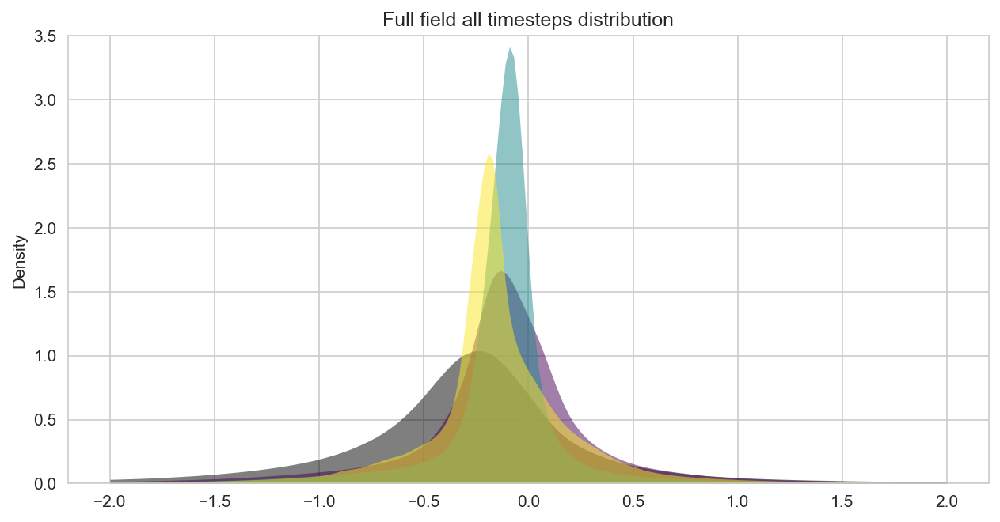

In [103]:
plt.figure(figsize=(10, 5), dpi= 150)
sns.set_style('whitegrid')
sns.kdeplot(np.array(ekf_enstd_monthly_fldmean_vector),fill=True, common_norm=False,color="black",alpha=0.5, linewidth=0, clip=(-2, 2)).set_title('Full field all timesteps distribution')
sns.kdeplot(np.array(tcr_enstd_monthly_fldmean_vector),fill=True, common_norm=False,color='#440154FF',alpha=0.5, linewidth=0, clip=(-2, 2))
sns.kdeplot(np.array(mpige_enstd_monthly_fldmean_vector),fill=True, common_norm=False,color='#238A8DFF',alpha=0.5, linewidth=0, clip=(-2, 2))
sns.kdeplot(np.array(csmlme_enstd_monthly_fldmean_vector),fill=True, common_norm=False,color='#FDE725FF',alpha=0.5, linewidth=0, clip=(-2, 2))
plt.ylim(0, 3.5)

In [104]:
ekf_enstd_JJA_fldmean = xr.open_dataset("/Volumes/SPARK/ekf400v2/ensmean/EKF400_ensmean_v2.0_t2m_anoms_JJA.nc",decode_times=False)
ekf_enstd_JJA_fldmean=ekf_enstd_JJA_fldmean.air_temperature.values

tcr_enstd_JJA_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_20cr_lowres_25_1979_RNN1lstm_mem_all_JJA.nc",decode_times=False)
tcr_enstd_JJA_fldmean=tcr_enstd_JJA_fldmean.t2m.values

mpige_enstd_JJA_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_mem_all_JJA.nc",decode_times=False)
mpige_enstd_JJA_fldmean=mpige_enstd_JJA_fldmean.t2m.values

csmlme_enstd_JJA_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_csmlme_lowres_25_1979_RNN1lstm_mem_all_JJA.nc",decode_times=False)
csmlme_enstd_JJA_fldmean=csmlme_enstd_JJA_fldmean.t2m.values






In [105]:
ekf_enstd_JJA_fldmean_vector=ekf_enstd_JJA_fldmean.reshape(402*96*192)
tcr_enstd_JJA_fldmean_vector=tcr_enstd_JJA_fldmean.reshape(402*96*192)
mpige_enstd_JJA_fldmean_vector=mpige_enstd_JJA_fldmean.reshape(402*96*192)
csmlme_enstd_JJA_fldmean_vector=csmlme_enstd_JJA_fldmean.reshape(402*96*192)

<AxesSubplot:title={'center':'Full field JJA distribution'}, ylabel='Density'>

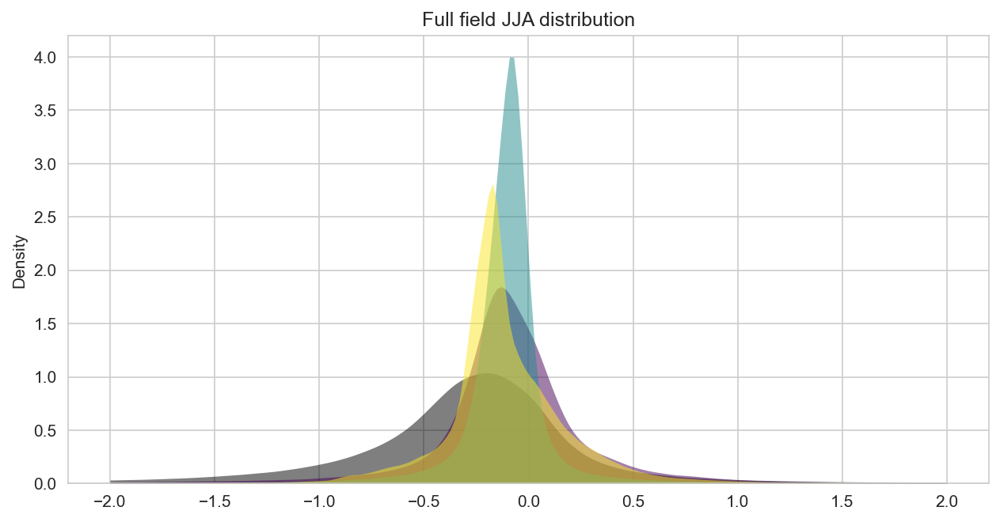

In [106]:
plt.figure(figsize=(10, 5), dpi= 150)
sns.set_style('whitegrid')
sns.kdeplot(np.array(ekf_enstd_JJA_fldmean_vector),fill=True, common_norm=False,color="black",alpha=0.5, linewidth=0, clip=(-2, 2)).set_title('Full field JJA distribution')
sns.kdeplot(np.array(tcr_enstd_JJA_fldmean_vector),fill=True, common_norm=False,color='#440154FF',alpha=0.5, linewidth=0, clip=(-2, 2))
sns.kdeplot(np.array(mpige_enstd_JJA_fldmean_vector),fill=True, common_norm=False,color='#238A8DFF',alpha=0.5, linewidth=0, clip=(-2, 2))
sns.kdeplot(np.array(csmlme_enstd_JJA_fldmean_vector),fill=True, common_norm=False,color='#FDE725FF',alpha=0.5, linewidth=0, clip=(-2, 2))

In [107]:
ekf_enstd_DJF_fldmean = xr.open_dataset("/Volumes/SPARK/ekf400v2/ensmean/EKF400_ensmean_v2.0_t2m_anoms_DJF.nc",decode_times=False)
ekf_enstd_DJF_fldmean=ekf_enstd_DJF_fldmean.air_temperature.values

tcr_enstd_DJF_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_20cr_lowres_25_1979_RNN1lstm_mem_all_DJF.nc",decode_times=False)
tcr_enstd_DJF_fldmean=tcr_enstd_DJF_fldmean.t2m.values

mpige_enstd_DJF_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_mem_all_DJF.nc",decode_times=False)
mpige_enstd_DJF_fldmean=mpige_enstd_DJF_fldmean.t2m.values

csmlme_enstd_DJF_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_csmlme_lowres_25_1979_RNN1lstm_mem_all_DJF.nc",decode_times=False)
csmlme_enstd_DJF_fldmean=csmlme_enstd_DJF_fldmean.t2m.values







In [108]:
ekf_enstd_DJF_fldmean_vector=ekf_enstd_DJF_fldmean.reshape(401*96*192)
tcr_enstd_DJF_fldmean_vector=tcr_enstd_DJF_fldmean.reshape(401*96*192)
mpige_enstd_DJF_fldmean_vector=mpige_enstd_DJF_fldmean.reshape(401*96*192)
csmlme_enstd_DJF_fldmean_vector=csmlme_enstd_DJF_fldmean.reshape(401*96*192)

(0.0, 4.0)

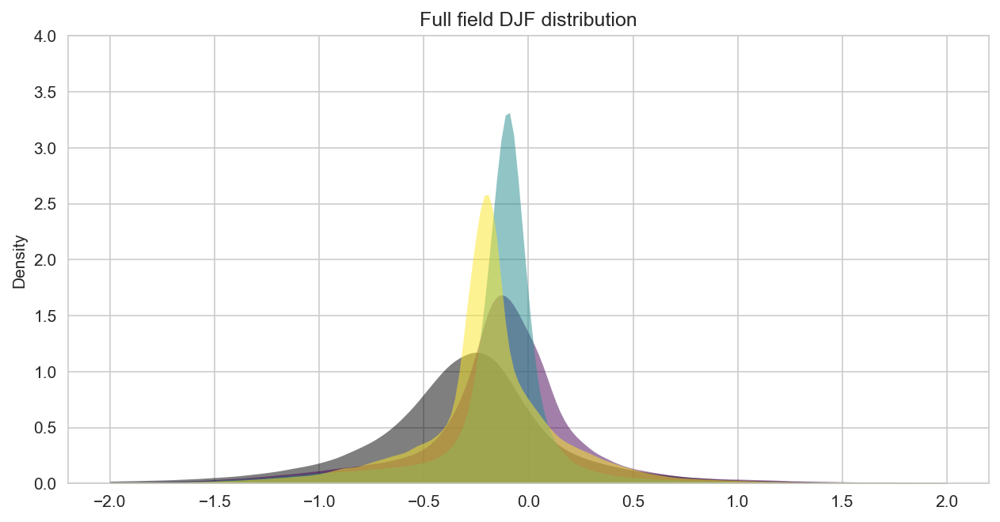

In [109]:
plt.figure(figsize=(10, 5), dpi= 150)
sns.set_style('whitegrid')
sns.kdeplot(np.array(ekf_enstd_DJF_fldmean_vector),fill=True, common_norm=False,color="black",alpha=0.5, linewidth=0, clip=(-2, 2)).set_title('Full field DJF distribution')
sns.kdeplot(np.array(tcr_enstd_DJF_fldmean_vector),fill=True, common_norm=False,color='#440154FF',alpha=0.5, linewidth=0, clip=(-2, 2))
sns.kdeplot(np.array(mpige_enstd_DJF_fldmean_vector),fill=True, common_norm=False,color='#238A8DFF',alpha=0.5, linewidth=0, clip=(-2, 2))
sns.kdeplot(np.array(csmlme_enstd_DJF_fldmean_vector),fill=True, common_norm=False,color='#FDE725FF',alpha=0.5, linewidth=0, clip=(-2, 2))
plt.ylim(0, 4)


In [110]:
ekf_enstd_monthly_NH_fldmean = xr.open_dataset("/Volumes/SPARK/ekf400v2/ensmean/EKF400_ensmean_v2.0_t2m_anoms_NH.nc",decode_times=False)
ekf_enstd_monthly_NH_fldmean=ekf_enstd_monthly_NH_fldmean.air_temperature.values

tcr_enstd_monthly_NH_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_20cr_lowres_25_1979_RNN1lstm_mem_all_monthly_NH.nc",decode_times=False)
tcr_enstd_monthly_NH_fldmean=tcr_enstd_monthly_NH_fldmean.t2m.values

mpige_enstd_monthly_NH_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_mem_all_monthly_NH.nc",decode_times=False)
mpige_enstd_monthly_NH_fldmean=mpige_enstd_monthly_NH_fldmean.t2m.values

csmlme_enstd_monthly_NH_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_csmlme_lowres_25_1979_RNN1lstm_mem_all_monthly_NH.nc",decode_times=False)
csmlme_enstd_monthly_NH_fldmean=csmlme_enstd_monthly_NH_fldmean.t2m.values






In [111]:
ekf_enstd_monthly_NH_fldmean_vector=ekf_enstd_monthly_NH_fldmean.reshape(4824*48*192)
tcr_enstd_monthly_NH_fldmean_vector=tcr_enstd_monthly_NH_fldmean.reshape(4824*48*192)
mpige_enstd_monthly_NH_fldmean_vector=mpige_enstd_monthly_NH_fldmean.reshape(4824*48*192)
csmlme_enstd_monthly_NH_fldmean_vector=csmlme_enstd_monthly_NH_fldmean.reshape(4824*48*192)

(0.0, 3.5)

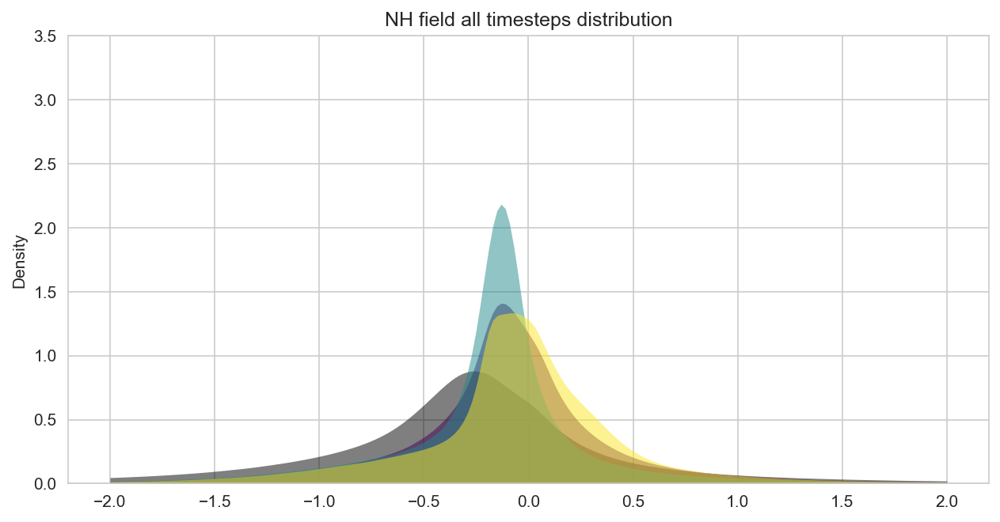

In [112]:
plt.figure(figsize=(10, 5), dpi= 150)
sns.set_style('whitegrid')
sns.kdeplot(np.array(ekf_enstd_monthly_NH_fldmean_vector),fill=True, common_norm=False,color="black",alpha=0.5, linewidth=0, clip=(-2, 2)).set_title('NH field all timesteps distribution')
sns.kdeplot(np.array(tcr_enstd_monthly_NH_fldmean_vector),fill=True, common_norm=False,color='#440154FF',alpha=0.5, linewidth=0, clip=(-2, 2))
sns.kdeplot(np.array(mpige_enstd_monthly_NH_fldmean_vector),fill=True, common_norm=False,color='#238A8DFF',alpha=0.5, linewidth=0, clip=(-2, 2))
sns.kdeplot(np.array(csmlme_enstd_monthly_NH_fldmean_vector),fill=True, common_norm=False,color='#FDE725FF',alpha=0.5, linewidth=0, clip=(-2, 2))
plt.ylim(0, 3.5)

## Figure 5

Winter 1830

In [113]:
ekf_enstd_DJF_fldmean = xr.open_dataset("/Volumes/SPARK/ekf400v2/ensmean/EKF400_ensmean_v2.0_t2m_anoms_DJF_1830.nc",decode_times=False)
ekf_enstd_DJF_fldmean=ekf_enstd_DJF_fldmean.air_temperature

#tcr_enstd_DJF_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_20cr_lowres_25_1979_RNN1lstm_mem_all_DJF.nc",decode_times=False)
#tcr_enstd_DJF_fldmean=tcr_enstd_DJF_fldmean.t2m.values

mpige_enstd_DJF_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_mem_all_DJF_1830.nc",decode_times=False)
mpige_enstd_DJF_fldmean=mpige_enstd_DJF_fldmean.t2m

tcr=xr.open_dataset("/Volumes/SPARK/20crv3/t2m/20CRv3_someyears_allmembers_t2m_anoms_DJF_1830.nc",decode_times=False)
tcr=tcr["2t"].drop('height')
tcr = tcr.squeeze('height')


In [114]:
ccc400_coldrec = xr.open_dataset("/Volumes/SPARK/ekf400v2/coldrec/Bayesian_recon_ccc_t_0.80n4.all.final_selwinter.nc",decode_times=False)
ccc400_coldrec=ccc400_coldrec.t2m
# 1809,1817,1822,1828,1830,1835
ccc400_coldrec

<xarray.DataArray 't2m' (Time: 6, latitude: 32, longitude: 192)>
array([[[ 0.166063,  0.174648, ...,  0.172871,  0.167326],
        [ 0.116282,  0.109248, ...,  0.140342,  0.121703],
        ...,
        [ 0.048657,  0.05992 , ...,  0.074043,  0.051182],
        [ 0.048231,  0.07737 , ...,  0.068389,  0.046241]],

       [[-0.26203 , -0.247296, ..., -0.292771, -0.273494],
        [-0.217335, -0.193446, ..., -0.255144, -0.235311],
        ...,
        [-0.329839, -0.319681, ..., -0.300832, -0.312209],
        [-0.303082, -0.278462, ..., -0.295246, -0.309677]],

       ...,

       [[-0.036551,  0.007667, ..., -0.097943, -0.073962],
        [ 0.015713,  0.059819, ..., -0.061988, -0.027957],
        ...,
        [ 0.134542,  0.170518, ...,  0.095851,  0.08996 ],
        [ 0.153955,  0.196062, ...,  0.106334,  0.110772]],

       [[-0.951275, -0.946856, ..., -1.013279, -0.970579],
        [-0.709394, -0.671546, ..., -0.814997, -0.741319],
        ...,
        [-0.052972, -0.088834, ..., -0.014356, -0.023564],
        [-0.033236, -0.11443 , ...,  0.002633,  0.010138]]])
Coordinates:
  * Time       (Time) float64 1.809e+03 1.817e+03 ... 1.83e+03 1.835e+03
  * longitude  (longitude) float64 0.0 1.875 3.75 5.625 ... 354.4 356.2 358.1
  * latitude   (latitude) float64 79.27 77.41 75.54 73.68 ... 25.18 23.32 21.45
Attributes:
    units:    K

In [115]:
ncar_coldrec = xr.open_dataset("/Volumes/SPARK/ekf400v2/coldrec/Bayesian_recon_ncar_t_0.80n4.all.final_selwinter.nc",decode_times=False)
ncar_coldrec=ncar_coldrec.t2m
# 1809,1817,1822,1828,1830,1835
ncar_coldrec

<xarray.DataArray 't2m' (Time: 6, Lat: 31, lon: 144)>
array([[[ 0.447827,  0.541379, ...,  0.317266,  0.356103],
        [ 0.345616,  0.457262, ...,  0.292593,  0.255943],
        ...,
        [-0.023961,  0.159238, ...,  0.077032, -0.075653],
        [ 0.524879,  0.444292, ...,  0.640209,  0.594162]],

       [[-0.259461, -0.302806, ..., -0.180107, -0.219854],
        [-0.203922, -0.25559 , ..., -0.144728, -0.171288],
        ...,
        [-1.201421, -1.209706, ..., -1.100425, -1.164417],
        [-1.122843, -1.164655, ..., -0.865058, -1.011588]],

       ...,

       [[-0.064283, -0.218563, ..., -0.030807, -0.101231],
        [-0.124653, -0.172784, ..., -0.015487, -0.067305],
        ...,
        [-2.298505, -1.744547, ..., -2.519386, -2.583927],
        [-2.114883, -2.008415, ..., -2.077298, -2.113119]],

       [[-0.185163, -0.237511, ..., -0.030723, -0.137199],
        [-0.106903, -0.188079, ...,  0.050949, -0.013335],
        ...,
        [-2.321529, -2.170758, ..., -1.883851, -2.225071],
        [-1.880319, -2.024001, ..., -1.30548 , -1.610772]]])
Coordinates:
  * Time     (Time) float64 1.809e+03 1.817e+03 1.822e+03 ... 1.83e+03 1.835e+03
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * Lat      (Lat) float64 21.79 23.68 25.58 27.47 ... 72.95 74.84 76.74 78.63
Attributes:
    units:    K

Summer 1816

In [116]:
ekf_enstd_JJA_fldmean = xr.open_dataset("/Volumes/SPARK/ekf400v2/ensmean/EKF400_ensmean_v2.0_t2m_anoms_JJA_1816_NH.nc",decode_times=False)
ekf_enstd_JJA_fldmean=ekf_enstd_JJA_fldmean.air_temperature[0,:,:]

tcr_enstd_JJA_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_20cr_lowres_25_1979_RNN1lstm_mem_all_JJA_1816_NH.nc",decode_times=False)
tcr_enstd_JJA_fldmean=tcr_enstd_JJA_fldmean.t2m[0,:,:]

mpige_enstd_JJA_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_mem_all_JJA_1816_NH.nc",decode_times=False)
mpige_enstd_JJA_fldmean=mpige_enstd_JJA_fldmean.t2m[0,:,:]

tcr=xr.open_dataset("/Volumes/SPARK/20crv3/t2m/20CRv3_allyears_allmembers_t2m_anoms_subs_JJA1816_NH.nc",decode_times=False)
tcr=tcr["2t"][0,:,:].drop('height')
tcr = tcr.squeeze('height')






/Users/mwegmann/miniconda2/envs/temprec/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:310: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


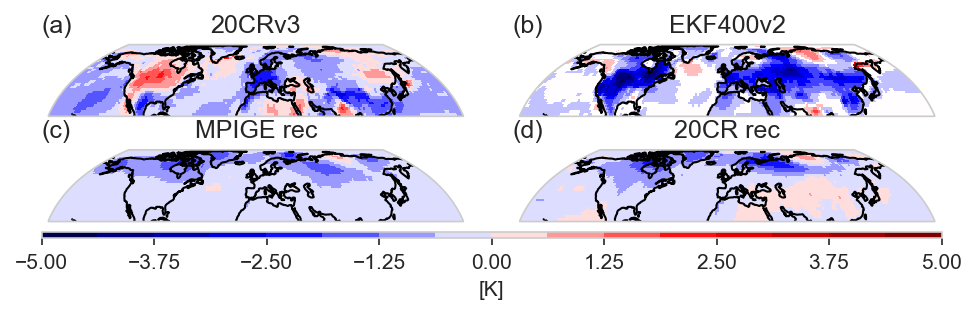

In [117]:
ds_merged_1816=xr.concat([tcr, ekf_enstd_JJA_fldmean,mpige_enstd_JJA_fldmean,tcr_enstd_JJA_fldmean],dim="height")

seasons=list(["20CRv3","EKF400v2","MPIGE rec","20CR rec"])
INDEX=list(["(a)","(b)","(c)","(d)"])
fig, axs = plt.subplots(2, 2, figsize=(10,2), dpi= 150,subplot_kw={'projection': ccrs.EqualEarth(central_longitude=0, globe=None)})
# axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
axs=axs.flatten()

#Loop over all of the models
for i in range(4):
    tplot=ds_merged_1816[i,:,:].plot.pcolormesh(ax=axs[i],levels = 17, vmax=5, transform=ccrs.PlateCarree(), cmap=cm.seismic,add_colorbar=False)
    axs[i].set_title(INDEX[i],loc='left')
    axs[i].coastlines()
    axs[i].set_title(seasons[i])

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.2, top=0.9, left=0.2, right=0.8,
                    wspace=0.1, hspace=0.004)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(tplot, cax=cbar_ax,orientation='horizontal')
cbar.set_label('[K]', size=10) 




# Make it nice
#plt.tight_layout()

Good Winter

In [118]:
pathToPostprocess = '/Users/mwegmann/Documents/small_spark/' 
#ds1 = xr.open_dataset(pathToERA + 'air.2m.mon.mean_18512015_anoms_rm_test2.nc')
#ds1_var=ds1.air
ds1 = xr.open_dataset(pathToPostprocess + '20CRv3_someyears_allmembers_t2m_anoms_winterpool.nc')
ds1_var=ds1["2t"]
ds1_var=ds1_var[:,0,:,:]
ds2 = xr.open_dataset(pathToPostprocess + 'EKF400_ensmean_v2.0_t2m_anoms_winterpool.nc')
ds2_var=ds2.air_temperature
ds3 = xr.open_dataset(pathToPostprocess + 'best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_mem_all_DJF_winterpool.nc',decode_times=False )
ds3_var=ds3.t2m

ds4 = xr.open_dataset(pathToPostprocess + 'Bayesian_recon_ccc_t_0.80n4.all.final_selwinter_anoms.nc',decode_times=False )
ds4_var=ds4.t2m

ds4_var=ds4_var.rename({'Time': "time",'longitude': "lon",'latitude': "lat"})


#ds4 = xr.open_dataset(pathToPostprocess + 'best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1_mem_all_monthly_tambora_summer1816.nc',decode_times=False)
#ds4_var=ds4.t2m

#ds5 = xr.open_dataset(pathToPostprocess + 'best_model_ekf400_anoms_20cr_lowres_25_1979_RNN1lstm_mem_all_monthly_tambora_summer1816.nc',decode_times=False)
#ds5_var=ds5.t2m


#air.2m.mon.mean_monanom.nc
ds4_var

<xarray.DataArray 't2m' (time: 6, lat: 32, lon: 192)>
array([[[ 0.166063,  0.174648, ...,  0.172871,  0.167326],
        [ 0.116282,  0.109248, ...,  0.140342,  0.121703],
        ...,
        [ 0.048657,  0.05992 , ...,  0.074043,  0.051182],
        [ 0.048231,  0.07737 , ...,  0.068389,  0.046241]],

       [[-0.26203 , -0.247296, ..., -0.292771, -0.273494],
        [-0.217335, -0.193446, ..., -0.255144, -0.235311],
        ...,
        [-0.329839, -0.319681, ..., -0.300832, -0.312209],
        [-0.303082, -0.278462, ..., -0.295246, -0.309677]],

       ...,

       [[-0.036551,  0.007667, ..., -0.097943, -0.073962],
        [ 0.015713,  0.059819, ..., -0.061988, -0.027957],
        ...,
        [ 0.134542,  0.170518, ...,  0.095851,  0.08996 ],
        [ 0.153955,  0.196062, ...,  0.106334,  0.110772]],

       [[-0.951275, -0.946856, ..., -1.013279, -0.970579],
        [-0.709394, -0.671546, ..., -0.814997, -0.741319],
        ...,
        [-0.052972, -0.088834, ..., -0.014356, -0.023564],
        [-0.033236, -0.11443 , ...,  0.002633,  0.010138]]])
Coordinates:
  * time     (time) float64 1.809e+03 1.817e+03 1.822e+03 ... 1.83e+03 1.835e+03
  * lon      (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
  * lat      (lat) float64 79.27 77.41 75.54 73.68 ... 27.05 25.18 23.32 21.45
Attributes:
    units:    K

Winter 1809

/Users/mwegmann/miniconda2/envs/temprec/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:310: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


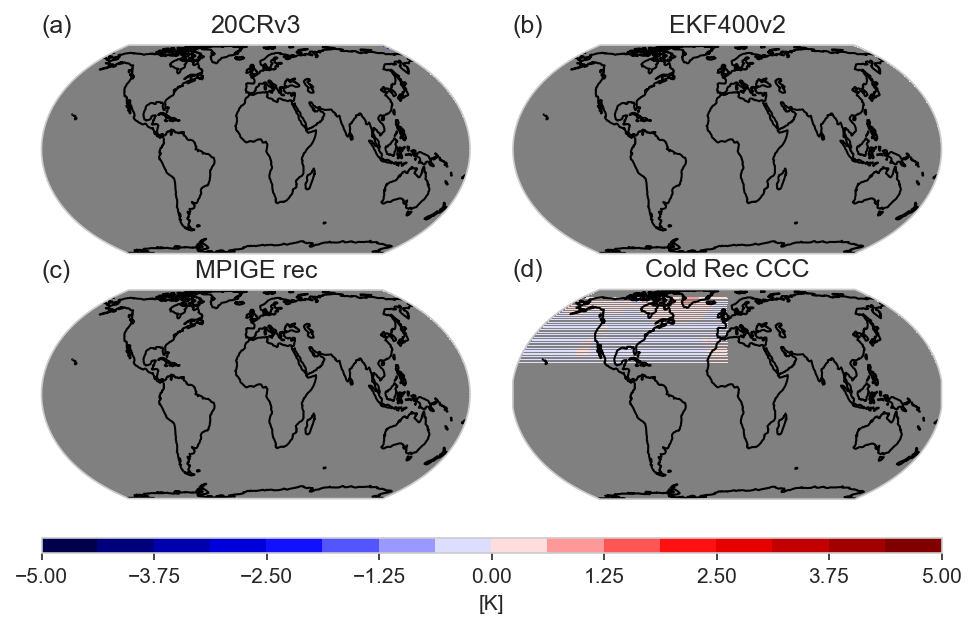

In [119]:
ds_merged_1809=xr.concat([ds1_var.isel(time=0), ds2_var.isel(time=0),ds3_var.isel(time=0),ds4_var.isel(time=0)],dim="height")

seasons=list(["20CRv3","EKF400v2","MPIGE rec","Cold Rec CCC"])
INDEX=list(["(a)","(b)","(c)","(d)"])
fig, axs = plt.subplots(2, 2, figsize=(10, 5), dpi= 150,subplot_kw={'projection': ccrs.EqualEarth(central_longitude=0, globe=None)})
# axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
axs=axs.flatten()

#Loop over all of the models
for i in range(4):
    tplot=ds_merged_1809[i,:,:].plot.pcolormesh(ax=axs[i],levels = 17, vmax=5, transform=ccrs.PlateCarree(), cmap=cm.seismic,add_colorbar=False)
    axs[i].set_title(INDEX[i],loc='left')
    axs[i].coastlines()
    axs[i].set_title(seasons[i])
    tplot.set_edgecolor('face')

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.25, top=0.9, left=0.2, right=0.8,
                    wspace=0.1, hspace=0.01)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(tplot, cax=cbar_ax,orientation='horizontal')
cbar.set_label('[K]', size=10) 




# Make it nice
#plt.tight_layout()

Winter 1817

/Users/mwegmann/miniconda2/envs/temprec/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:310: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


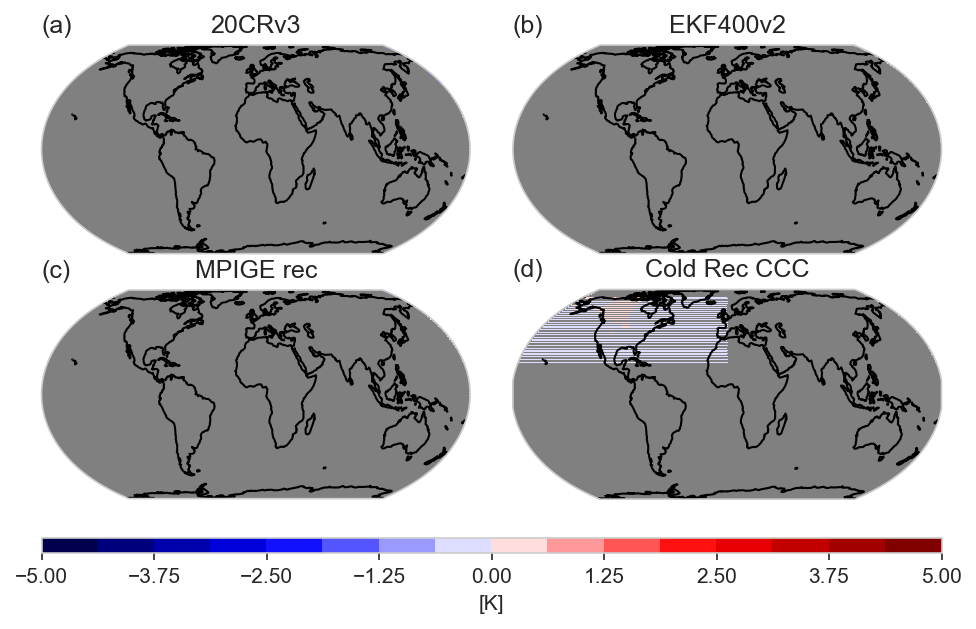

In [120]:
ds_merged_1817=xr.concat([ds1_var.isel(time=1), ds2_var.isel(time=1),ds3_var.isel(time=1),ds4_var.isel(time=1)],dim="height")

seasons=list(["20CRv3","EKF400v2","MPIGE rec","Cold Rec CCC"])
INDEX=list(["(a)","(b)","(c)","(d)"])
fig, axs = plt.subplots(2, 2, figsize=(10, 5), dpi= 150,subplot_kw={'projection': ccrs.EqualEarth(central_longitude=0, globe=None)})
# axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
axs=axs.flatten()

#Loop over all of the models
for i in range(4):
    tplot=ds_merged_1817[i,:,:].plot.pcolormesh(ax=axs[i],levels = 17, vmax=5, transform=ccrs.PlateCarree(), cmap=cm.seismic,add_colorbar=False)
    axs[i].set_title(INDEX[i],loc='left')
    axs[i].coastlines()
    axs[i].set_title(seasons[i])
    tplot.set_edgecolor('face')


# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.25, top=0.9, left=0.2, right=0.8,
                    wspace=0.1, hspace=0.01)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(tplot, cax=cbar_ax,orientation='horizontal')
cbar.set_label('[K]', size=10) 




# Make it nice
#plt.tight_layout()

Winter 1828

/Users/mwegmann/miniconda2/envs/temprec/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:310: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


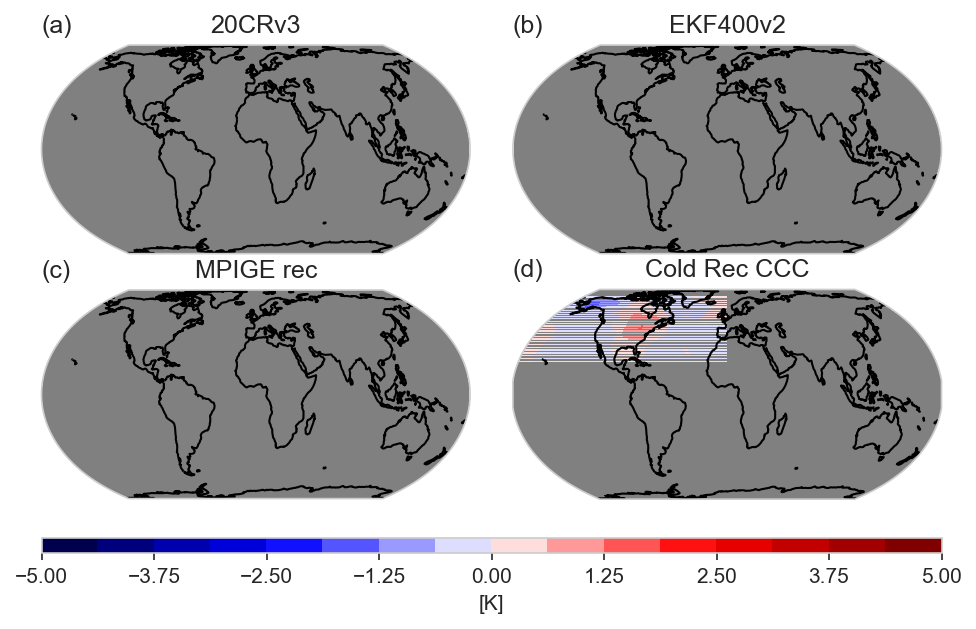

In [121]:
ds_merged_1828=xr.concat([ds1_var.isel(time=2), ds2_var.isel(time=2),ds3_var.isel(time=2),ds4_var.isel(time=3)],dim="height")

seasons=list(["20CRv3","EKF400v2","MPIGE rec","Cold Rec CCC"])
INDEX=list(["(a)","(b)","(c)","(d)"])
fig, axs = plt.subplots(2, 2, figsize=(10, 5), dpi= 150,subplot_kw={'projection': ccrs.EqualEarth(central_longitude=0, globe=None)})
# axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
axs=axs.flatten()

#Loop over all of the models
for i in range(4):
    tplot=ds_merged_1828[i,:,:].plot.pcolormesh(ax=axs[i],levels = 17, vmax=5, transform=ccrs.PlateCarree(), cmap=cm.seismic,add_colorbar=False,linewidth=0,rasterized=True)
    axs[i].set_title(INDEX[i],loc='left')
    axs[i].coastlines()
    axs[i].set_title(seasons[i])
    tplot.set_edgecolor('face')

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.25, top=0.9, left=0.2, right=0.8,
                    wspace=0.1, hspace=0.01)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(tplot, cax=cbar_ax,orientation='horizontal')
cbar.set_label('[K]', size=10) 




# Make it nice
#plt.tight_layout()

Winter 1835

/Users/mwegmann/miniconda2/envs/temprec/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:310: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


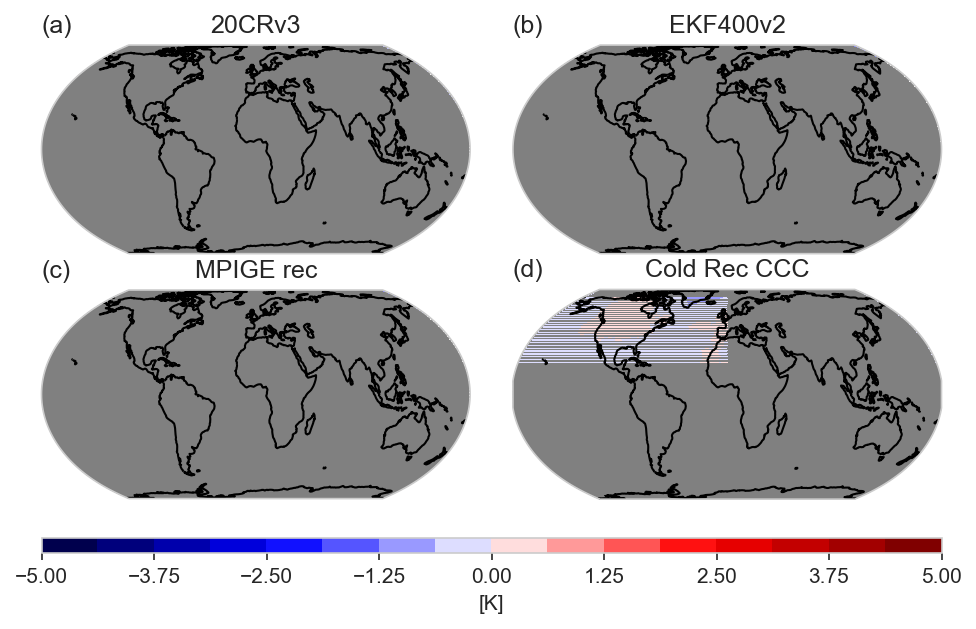

In [122]:
ds_merged_1835=xr.concat([ds1_var.isel(time=3), ds2_var.isel(time=3),ds3_var.isel(time=3),ds4_var.isel(time=5)],dim="height")

seasons=list(["20CRv3","EKF400v2","MPIGE rec","Cold Rec CCC"])
INDEX=list(["(a)","(b)","(c)","(d)"])
fig, axs = plt.subplots(2, 2, figsize=(10, 5), dpi= 150,subplot_kw={'projection': ccrs.EqualEarth(central_longitude=0, globe=None)})
# axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
axs=axs.flatten()

#Loop over all of the models
for i in range(4):
    tplot=ds_merged_1835[i,:,:].plot.pcolormesh(ax=axs[i],levels = 17, vmax=5, transform=ccrs.PlateCarree(), cmap=cm.seismic,add_colorbar=False)
    axs[i].set_title(INDEX[i],loc='left')
    axs[i].coastlines()
    axs[i].set_title(seasons[i])
    tplot.set_edgecolor('face')

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.25, top=0.9, left=0.2, right=0.8,
                    wspace=0.1, hspace=0.01)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(tplot, cax=cbar_ax,orientation='horizontal')
cbar.set_label('[K]', size=10) 




# Make it nice
#plt.tight_layout()

Winter 1830

In [123]:
ekf_enstd_DJF_fldmean = xr.open_dataset("/Volumes/SPARK/ekf400v2/ensmean/EKF400_ensmean_v2.0_t2m_anoms_DJF_1830.nc",decode_times=False)
ekf_enstd_DJF_fldmean=ekf_enstd_DJF_fldmean.air_temperature[0,:,:]

#tcr_enstd_DJF_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_20cr_lowres_25_1979_RNN1lstm_mem_all_DJF.nc",decode_times=False)
#tcr_enstd_DJF_fldmean=tcr_enstd_DJF_fldmean.t2m.values

mpige_enstd_DJF_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_mem_all_DJF_1830.nc",decode_times=False)
mpige_enstd_DJF_fldmean=mpige_enstd_DJF_fldmean.t2m[0,:,:]

tcr=xr.open_dataset("/Volumes/SPARK/20crv3/t2m/20CRv3_someyears_allmembers_t2m_anoms_DJF_1830.nc",decode_times=False)
tcr=tcr["2t"][0,:,:].drop('height')
tcr = tcr.squeeze('height')



/Users/mwegmann/miniconda2/envs/temprec/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:310: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


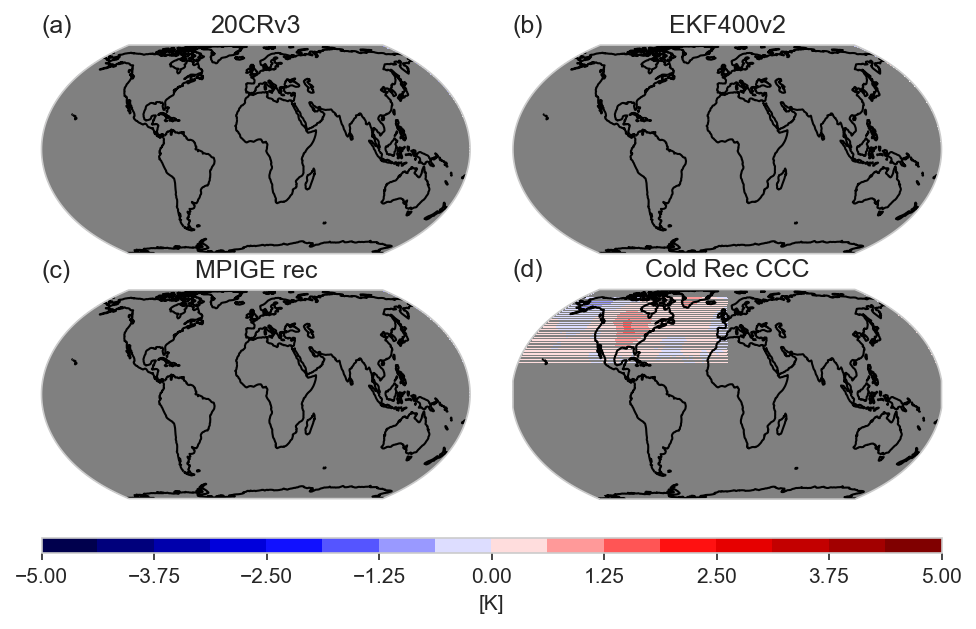

In [124]:
ds_merged_1830=xr.concat([tcr, ekf_enstd_DJF_fldmean,mpige_enstd_DJF_fldmean,ds4_var.isel(time=4)],dim="height")

seasons=list(["20CRv3","EKF400v2","MPIGE rec","Cold Rec CCC"])
INDEX=list(["(a)","(b)","(c)","(d)"])
fig, axs = plt.subplots(2, 2, figsize=(10, 5), dpi= 150,subplot_kw={'projection': ccrs.EqualEarth(central_longitude=0, globe=None)})
# axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
axs=axs.flatten()

#Loop over all of the models
for i in range(4):
    tplot=ds_merged_1830[i,:,:].plot.pcolormesh(ax=axs[i],levels = 17, vmax=5, transform=ccrs.PlateCarree(), cmap=cm.seismic,add_colorbar=False)
    axs[i].set_title(INDEX[i],loc='left')
    axs[i].coastlines()
    axs[i].set_title(seasons[i])
    tplot.set_edgecolor('face')

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.25, top=0.9, left=0.2, right=0.8,
                    wspace=0.1, hspace=0.01)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(tplot, cax=cbar_ax,orientation='horizontal')
cbar.set_label('[K]', size=10) 




# Make it nice
#plt.tight_layout()

Winter 1822

In [125]:
ekf_enstd_DJF_fldmean = xr.open_dataset("/Volumes/SPARK/ekf400v2/ensmean/EKF400_ensmean_v2.0_t2m_anoms_DJF_1822.nc",decode_times=False)
ekf_enstd_DJF_fldmean=ekf_enstd_DJF_fldmean.air_temperature[0,:,:]

#tcr_enstd_DJF_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_20cr_lowres_25_1979_RNN1lstm_mem_all_DJF.nc",decode_times=False)
#tcr_enstd_DJF_fldmean=tcr_enstd_DJF_fldmean.t2m.values

mpige_enstd_DJF_fldmean = xr.open_dataset("/Volumes/SPARK/RNN_savestates/best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_mem_all_DJF_1822.nc",decode_times=False)
mpige_enstd_DJF_fldmean=mpige_enstd_DJF_fldmean.t2m[0,:,:]

tcr=xr.open_dataset("/Volumes/SPARK/20crv3/t2m/20CRv3_someyears_allmembers_t2m_anoms_DJF_1822.nc",decode_times=False)
tcr=tcr["2t"][0,:,:].drop('height')
tcr = tcr.squeeze('height')




/Users/mwegmann/miniconda2/envs/temprec/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:310: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


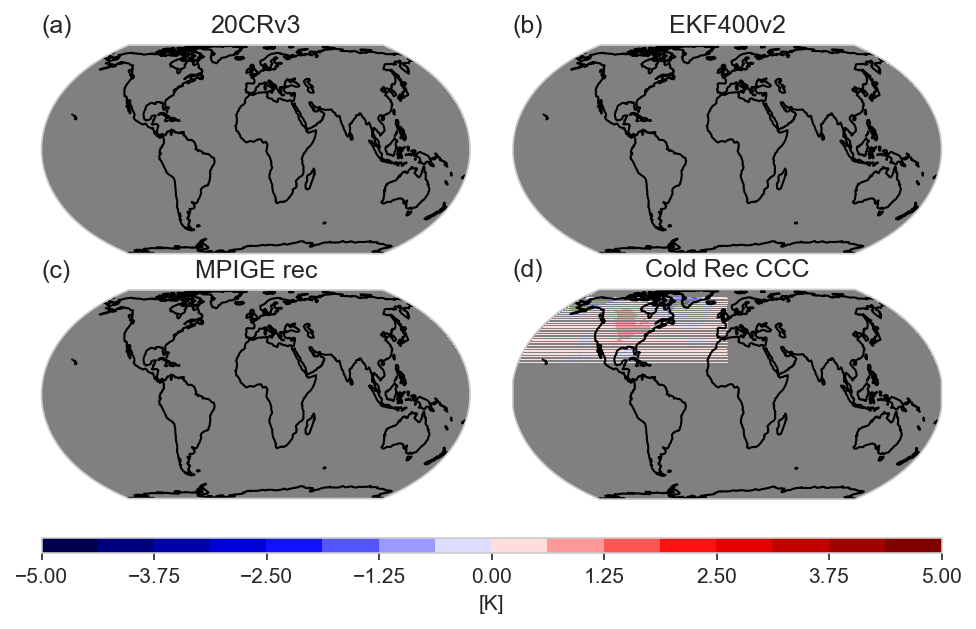

In [126]:
ds_merged_1822=xr.concat([tcr, ekf_enstd_DJF_fldmean,mpige_enstd_DJF_fldmean,ds4_var.isel(time=2)],dim="height")

seasons=list(["20CRv3","EKF400v2","MPIGE rec","Cold Rec CCC"])
INDEX=list(["(a)","(b)","(c)","(d)"])
fig, axs = plt.subplots(2, 2, figsize=(10, 5), dpi= 150,subplot_kw={'projection': ccrs.EqualEarth(central_longitude=0, globe=None)})
# axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
axs=axs.flatten()

#Loop over all of the models
for i in range(4):
    tplot=ds_merged_1822[i,:,:].plot.pcolormesh(ax=axs[i],levels = 17, vmax=5, transform=ccrs.PlateCarree(), cmap=cm.seismic,add_colorbar=False)
    axs[i].set_title(INDEX[i],loc='left')
    axs[i].coastlines()
    axs[i].set_title(seasons[i])
    tplot.set_edgecolor('face')

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.25, top=0.9, left=0.2, right=0.8,
                    wspace=0.1, hspace=0.01)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(tplot, cax=cbar_ax,orientation='horizontal')
cbar.set_label('[K]', size=10) 




# Make it nice
#plt.tight_layout()